In [ ]:
!pip install feature_engine dmba yellowbrick xgboost catboost ngboost lightgbm

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from feature_engine.outliers import Winsorizer
import warnings, re, gc, joblib
warnings.filterwarnings('ignore')
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.preprocessing import MinMaxScaler,StandardScaler,LabelEncoder
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, accuracy_score, classification_report
from dmba import regressionSummary, classificationSummary
from sklearn.tree import DecisionTreeRegressor
from yellowbrick.regressor import ResidualsPlot
from sklearn.linear_model import LinearRegression, SGDRegressor, PassiveAggressiveRegressor, Lasso, Ridge, ElasticNet, HuberRegressor, RANSACRegressor, TheilSenRegressor, ARDRegression, BayesianRidge, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.neural_network import MLPRegressor
import xgboost as xgb
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from lightgbm import LGBMRegressor
from sklearn.feature_selection import SelectFromModel
from xgboost import XGBRegressor, XGBRFRegressor
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor, HistGradientBoostingRegressor, StackingRegressor, VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from sklearn.pipeline import Pipeline

Colab environment detected.


In [ ]:
df = pd.read_csv('/content/HousingDataSet.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503


In [ ]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21611 non-null  float64
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [ ]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21611.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.396095,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.128162,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [ ]:
df['date'] = pd.to_datetime(df['date'])

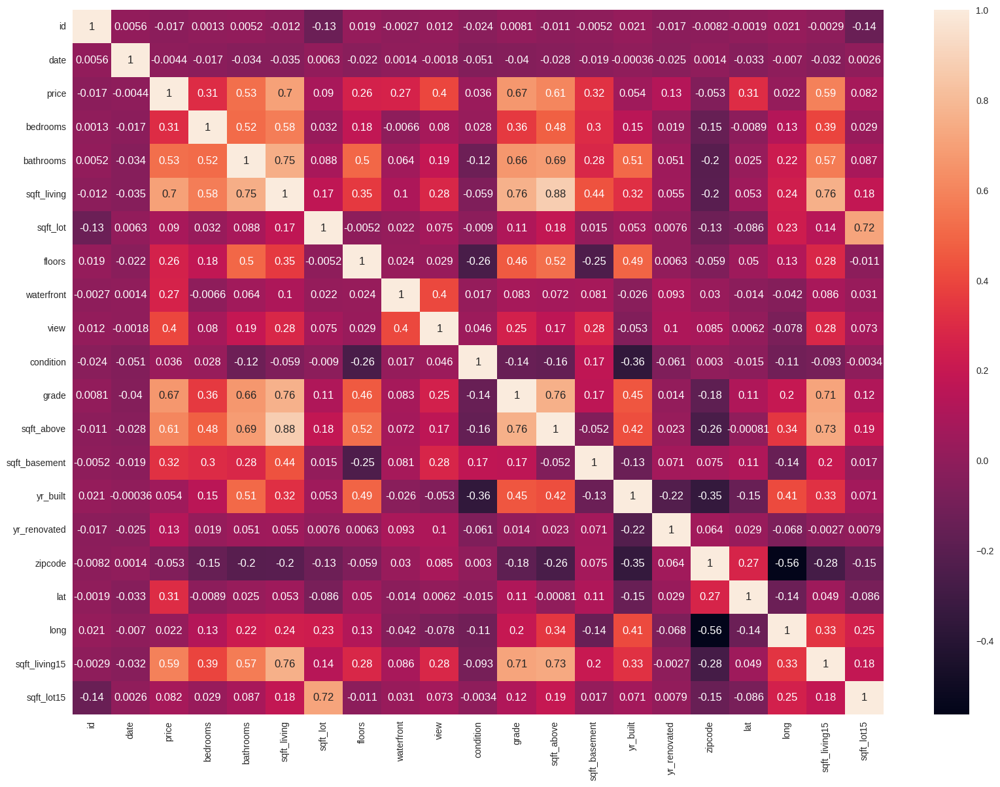

In [ ]:
plt.figure(figsize=(20,14))
sns.heatmap(df.corr(), annot=True);

# Handling Missing Values

In [ ]:
df.isna().sum().sort_values(ascending=False)

,0
sqft_above,2
id,0
grade,0
sqft_living15,0
long,0
lat,0
zipcode,0
yr_renovated,0
yr_built,0
sqft_basement,0


## Since there are only 2 missing values hence we imputed them using Median of the specific column

In [ ]:
df['sqft_above'].fillna(df['sqft_above'].median(), inplace=True)
# imputed the missing values with median

Skewness of id: 0.24332854761624428
Kurtosis of id: -1.260541870514302


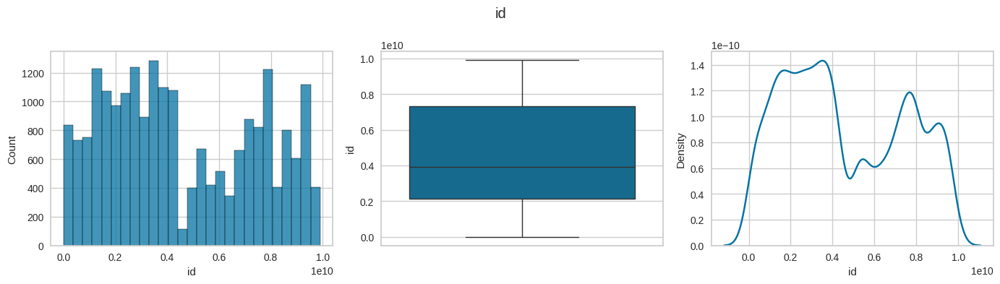

Skewness of price: 4.024069144684712
Kurtosis of price: 34.58554043194243


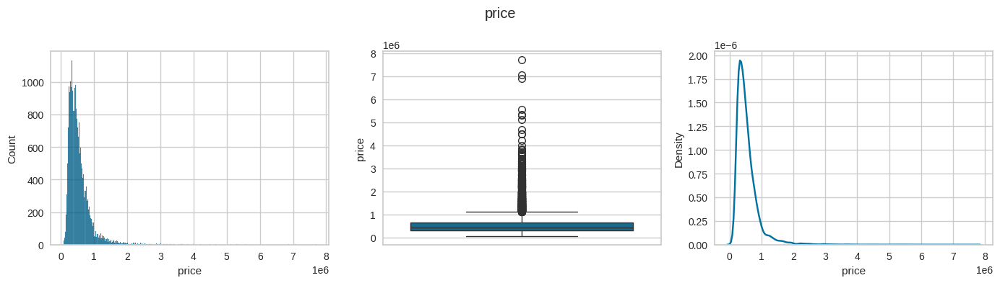

Skewness of bedrooms: 1.97429953543601
Kurtosis of bedrooms: 49.06365318170099


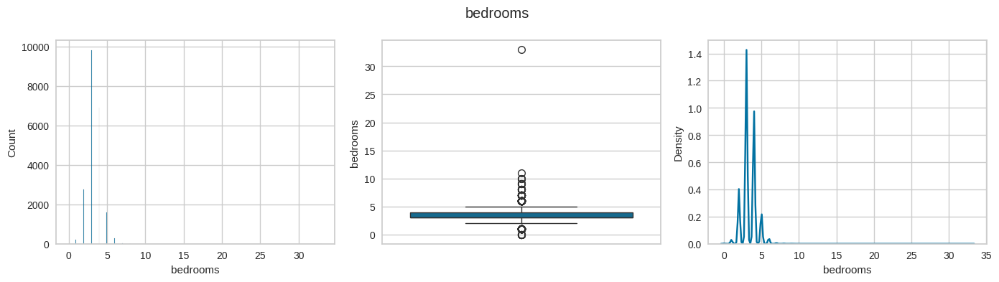

Skewness of bathrooms: 0.5111075733474171
Kurtosis of bathrooms: 1.2799024441754554


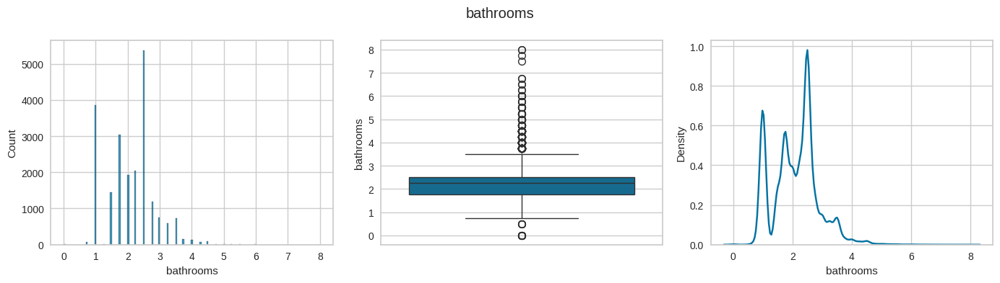

Skewness of sqft_living: 1.471555426802092
Kurtosis of sqft_living: 5.24309298981711


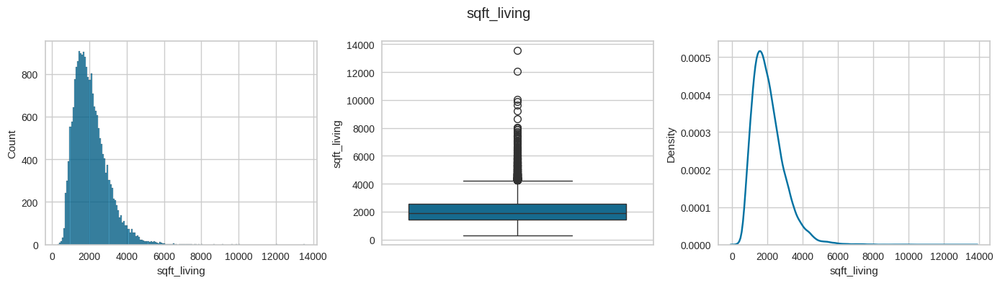

Skewness of sqft_lot: 13.060018959031755
Kurtosis of sqft_lot: 285.0778196973658


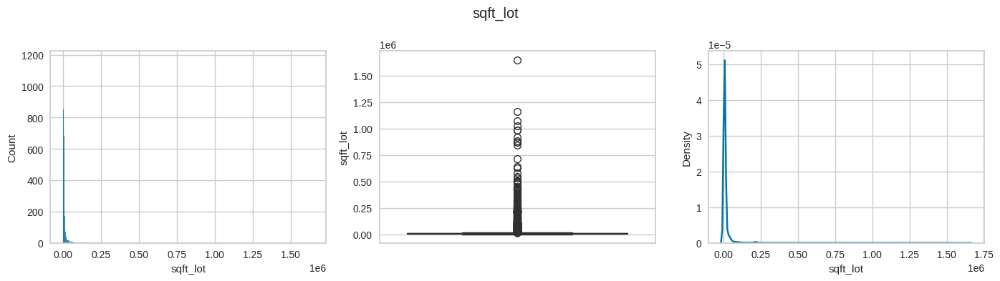

Skewness of floors: 0.616176721157611
Kurtosis of floors: -0.4847229368298285


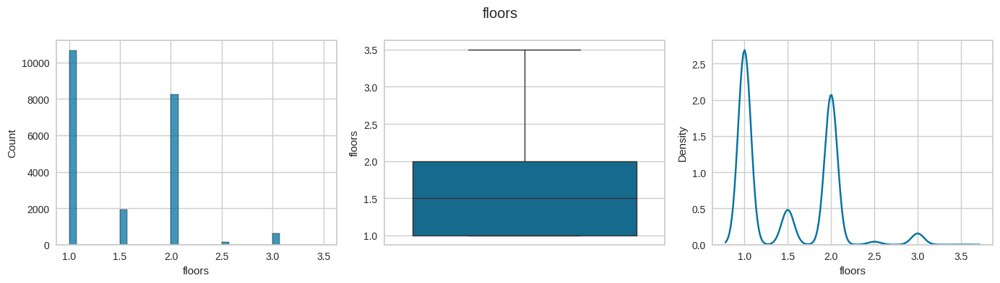

Skewness of waterfront: 11.385107942339081
Kurtosis of waterfront: 127.63249356537696


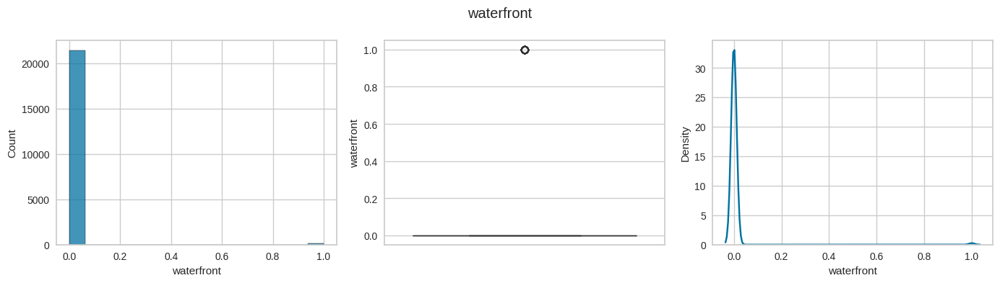

Skewness of view: 3.395749593248714
Kurtosis of view: 10.893021684601504


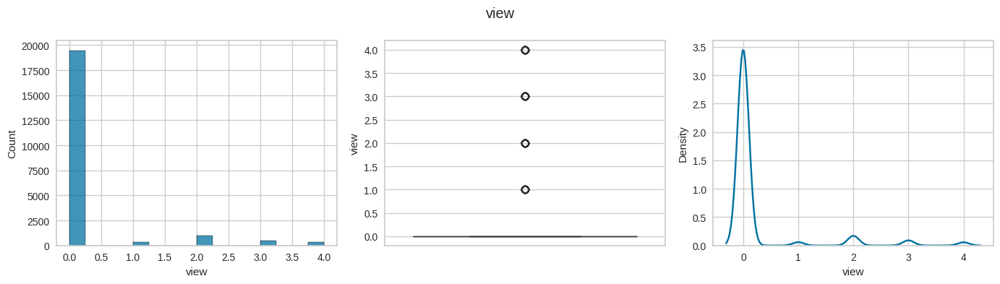

Skewness of condition: 1.0328046374434587
Kurtosis of condition: 0.5257635652845423


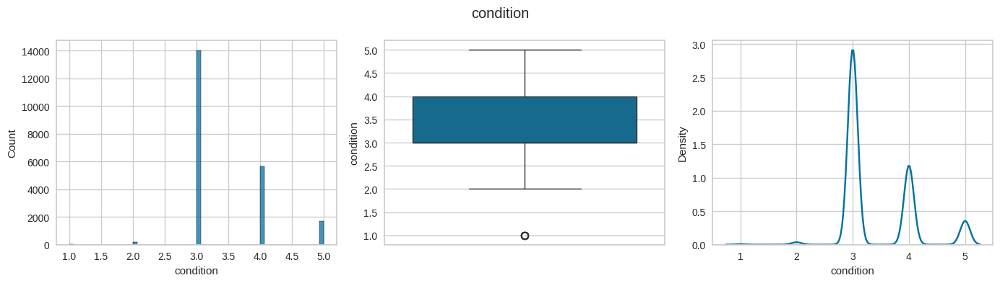

Skewness of grade: 0.7711032007576067
Kurtosis of grade: 1.1909320773987657


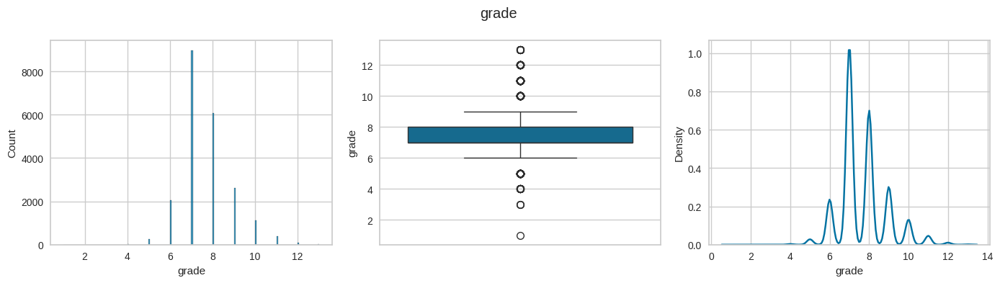

Skewness of sqft_above: 1.446710715799763
Kurtosis of sqft_above: 3.4023589407590213


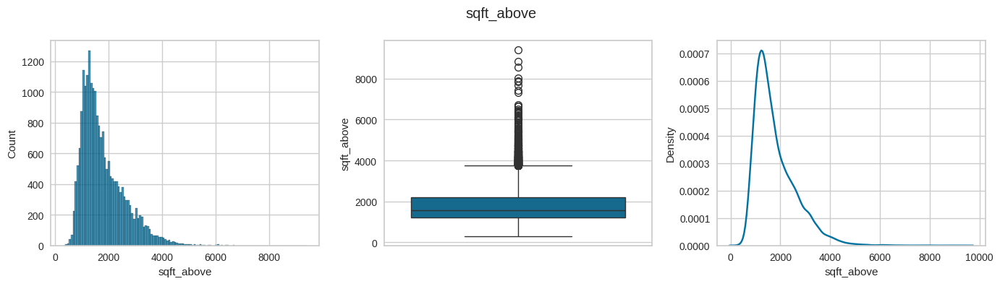

Skewness of sqft_basement: 1.5779650555996247
Kurtosis of sqft_basement: 2.7155742114129353


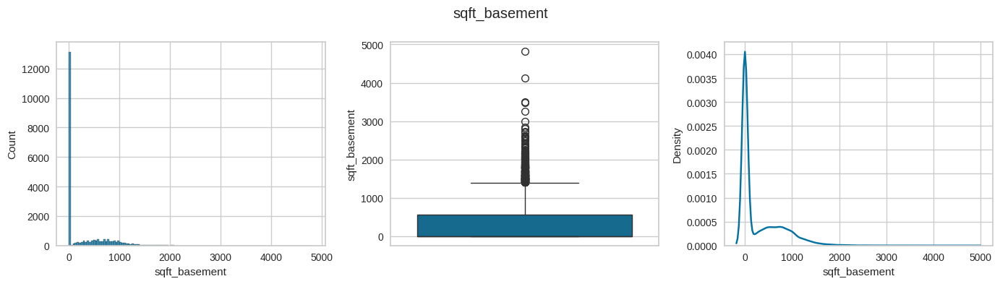

Skewness of yr_built: -0.46980539881436767
Kurtosis of yr_built: -0.657407504733527


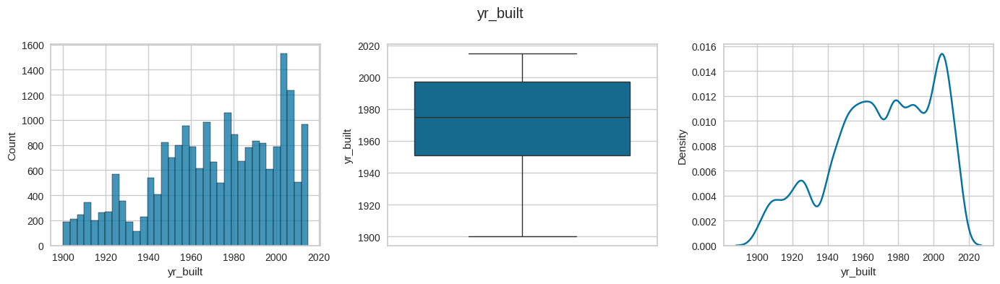

Skewness of yr_renovated: 4.549493366993928
Kurtosis of yr_renovated: 18.701152117599058


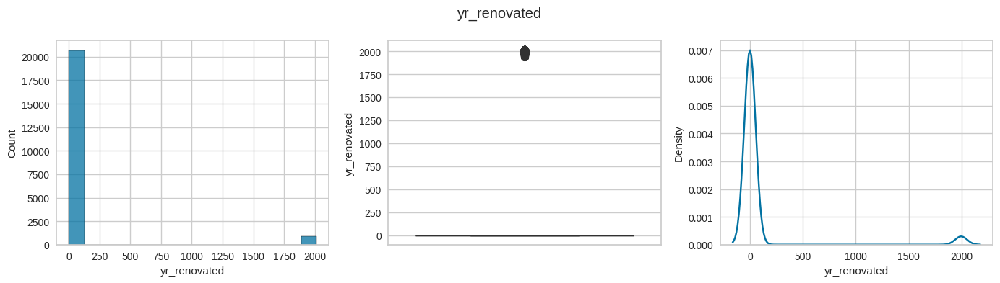

Skewness of zipcode: 0.4056612082396646
Kurtosis of zipcode: -0.8534788732101246


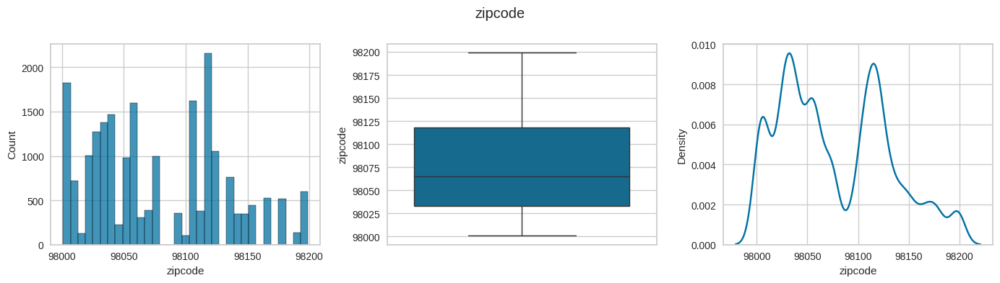

Skewness of lat: -0.4852704765380854
Kurtosis of lat: -0.6763130016065348


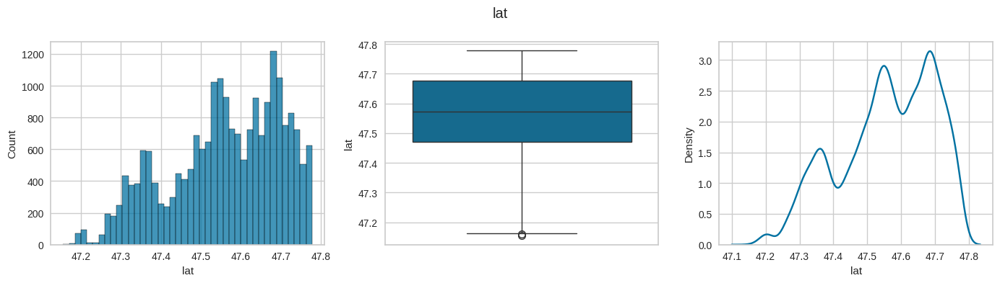

Skewness of long: 0.8850529834328096
Kurtosis of long: 1.0495008872914617


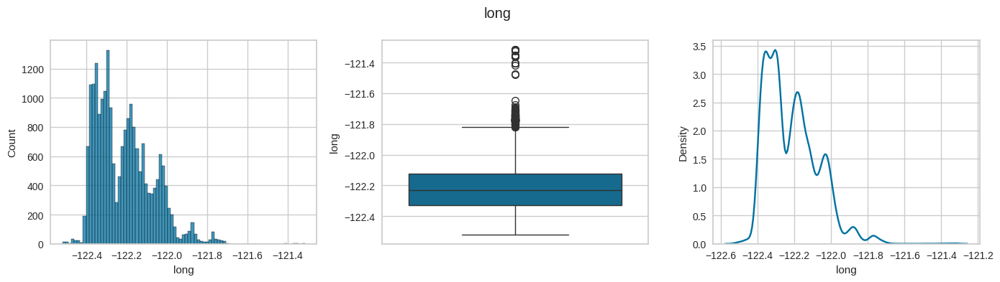

Skewness of sqft_living15: 1.1081812758966967
Kurtosis of sqft_living15: 1.5970958104616884


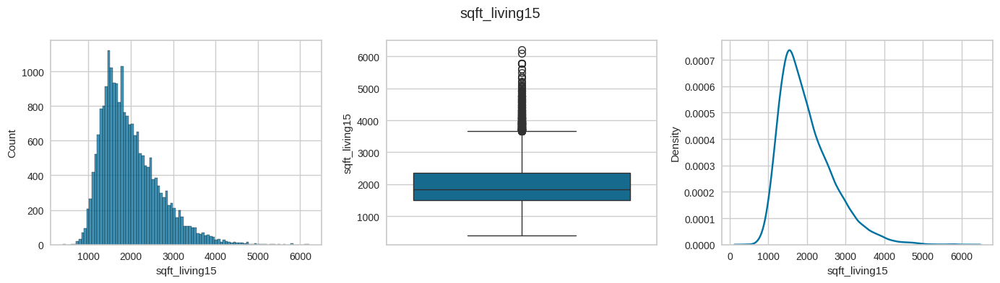

Skewness of sqft_lot15: 9.506743246764398
Kurtosis of sqft_lot15: 150.76311004626973


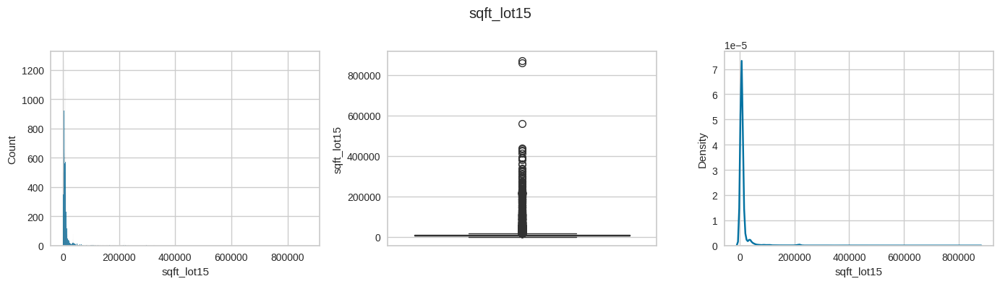

In [ ]:
for col in df.select_dtypes(np.number).columns:
  print(f"Skewness of {col}: {df[col].skew()}")
  print(f"Kurtosis of {col}: {df[col].kurtosis()}")
  fig, axes = plt.subplots(1,3,figsize=(14,4))
  sns.histplot(df[col], ax=axes[0])
  sns.boxplot(df[col], ax=axes[1])
  sns.kdeplot(df[col], ax=axes[2])
  plt.suptitle(col)
  plt.tight_layout()
  plt.show()

In [ ]:
outlier_cols = ['grade','sqft_above','sqft_basement','sqft_living','bathrooms','bedrooms','sqft_living15','price']

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  float64       
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

# Handling Outliers

### Using IQR technique to handle outliers

In [ ]:
def impute_outliers(data,col):

  winsorizer = Winsorizer(capping_method='iqr',tail='both',fold=1.5)
  data[col] = winsorizer.fit_transform(data[[col]])
  return data[col]

  # Median se scale/adjust krta hai

Skewness of grade: 0.2785616882439079
Kurtosis of grade: -0.6320676704821757


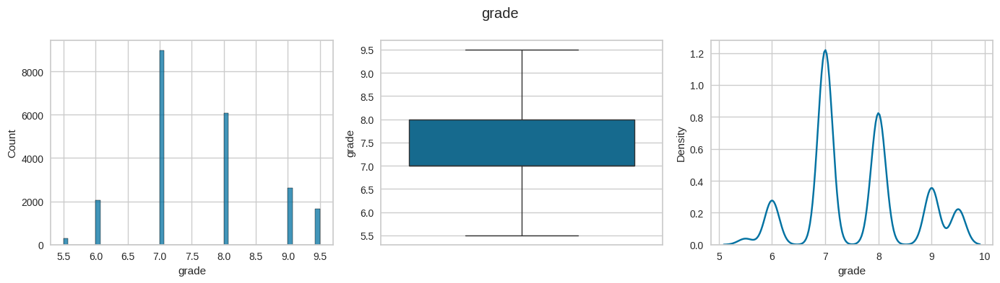

Skewness of sqft_above: 0.9054884853207321
Kurtosis of sqft_above: 0.05976655111378415


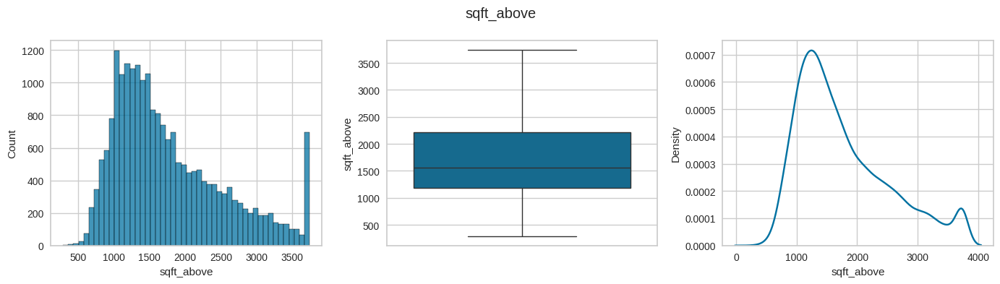

Skewness of sqft_basement: 1.219020537062663
Kurtosis of sqft_basement: 0.1936347042820432


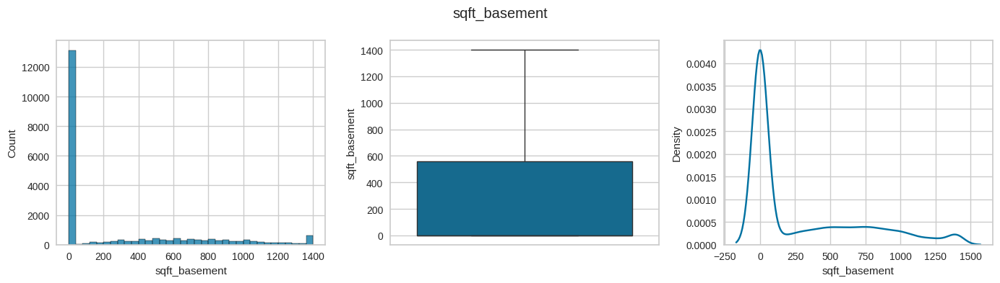

Skewness of sqft_living: 0.7292608623795083
Kurtosis of sqft_living: 0.01183256996065074


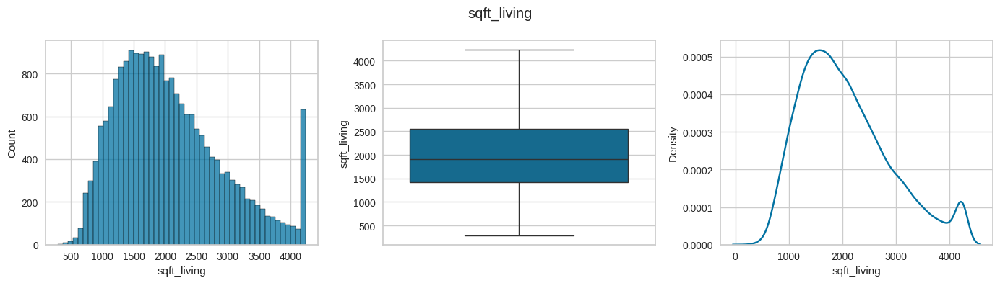

Skewness of bathrooms: 0.04359731525272025
Kurtosis of bathrooms: -0.6365923500086539


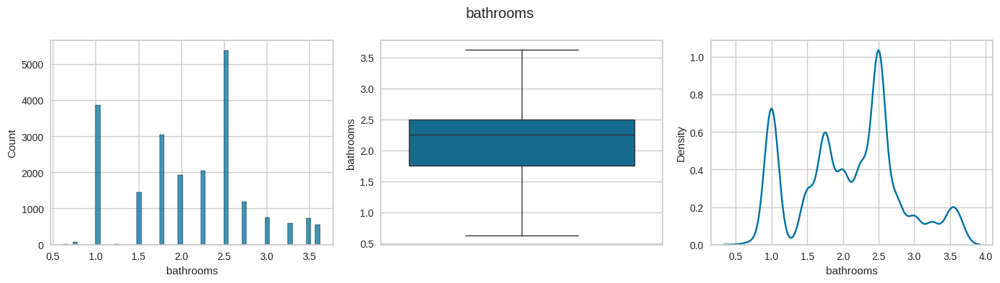

Skewness of bedrooms: 0.2407904017686034
Kurtosis of bedrooms: -0.23047965403375947


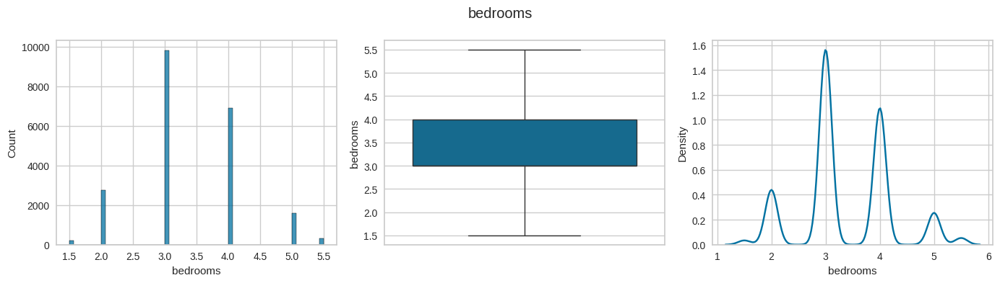

Skewness of sqft_living15: 0.7741322044506928
Kurtosis of sqft_living15: 0.015520401079126778


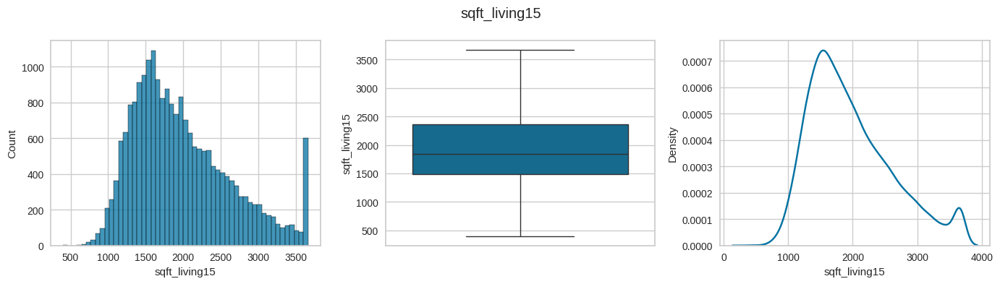

Skewness of price: 0.9366357797904826
Kurtosis of price: 0.1990413017742041


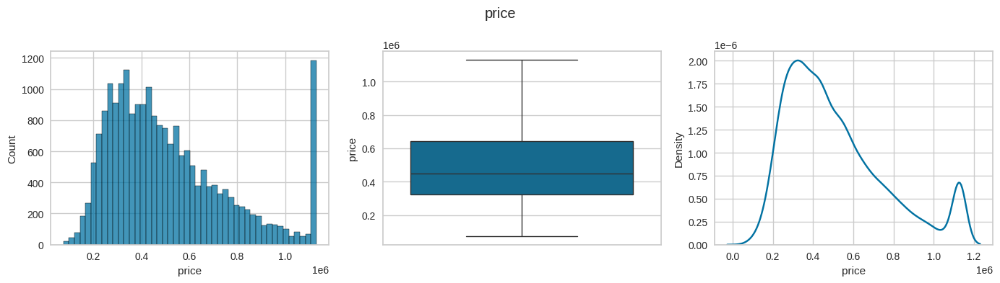

In [ ]:
for col in outlier_cols:
  df[col] = impute_outliers(df,col)
  print(f"Skewness of {col}: {df[col].skew()}")
  print(f"Kurtosis of {col}: {df[col].kurtosis()}")
  fig, axes = plt.subplots(1,3,figsize=(14,4))
  sns.histplot(df[col], ax=axes[0])
  sns.boxplot(df[col], ax=axes[1])
  sns.kdeplot(df[col], ax=axes[2])
  plt.suptitle(col)
  plt.tight_layout()
  plt.show();

### Feature Extraction

In [ ]:
df['Month'] = df['date'].dt.month
df['Year'] = df['date'].dt.year
df['Day'] = df['date'].dt.day
df['DayofWeek'] = df['date'].dt.dayofweek
df['DayofYear'] = df['date'].dt.dayofyear
df['Quarter'] = df['date'].dt.quarter
df['IsWeekend'] = (df['date'].dt.weekday >= 5).astype(np.int32)

df.drop('date', axis=1, inplace=True)

In [ ]:
df.count()

,0
id,21613
price,21613
bedrooms,21613
bathrooms,21613
sqft_living,21613
sqft_lot,21613
floors,21613
waterfront,21613
view,21613
condition,21613


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 27 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  float64
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  float64
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  float64
 11  sqft_above     21613 non-null  float64
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

# Splitting the data

In [ ]:
X = df.drop('price', axis=1)
y = df['price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True) # Split the data into training and testing sets

# Scaling the Data using Min_Max Scaler

In [ ]:
scaler = MinMaxScaler()
features = X_train.columns
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_train = pd.DataFrame(scaled_X_train, columns=features)
scaled_X_test = scaler.transform(X_test)
scaled_X_test = pd.DataFrame(scaled_X_test, columns=features)
scaled_X_train.head()

,id,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,long,sqft_living15,sqft_lot15,Month,Year,Day,DayofWeek,DayofYear,Quarter,IsWeekend
0,0.552269,0.375,0.375000,0.377741,0.010801,0.0,0.0,0.0,0.75,0.875,...,0.304817,0.719841,0.014294,0.363636,0.0,0.866667,0.166667,0.399449,0.333333,0.0
1,0.942600,0.125,0.125000,0.179997,0.002731,0.0,0.0,0.0,0.50,0.125,...,0.190199,0.266687,0.004996,0.181818,1.0,0.300000,0.166667,0.184573,0.000000,0.0
2,0.243055,0.375,0.125000,0.200279,0.005983,0.2,0.0,0.0,0.50,0.125,...,0.152824,0.236069,0.008212,0.090909,1.0,0.833333,0.500000,0.151515,0.000000,0.0
3,0.552147,0.375,0.541667,0.456332,0.005995,0.0,0.0,0.0,0.75,0.375,...,0.288206,0.428965,0.007695,0.000000,1.0,0.233333,0.500000,0.016529,0.000000,0.0
4,0.305592,0.125,0.625000,0.367854,0.000789,0.4,0.0,0.0,0.50,0.625,...,0.257475,0.517759,0.011261,0.272727,1.0,0.533333,0.666667,0.289256,0.333333,0.0


In [ ]:
scaled_X_train.shape, scaled_X_test.shape

((17290, 26), (4323, 26))

# Feature Selection

In [ ]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(scaled_X_train, y_train)

SelectKBest(score_func=<function f_regression at 0x7866631ebba0>)

In [ ]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['bedrooms', 'bathrooms', 'sqft_living', 'floors', 'view', 'grade',
       'sqft_above', 'sqft_basement', 'lat', 'sqft_living15'],
      dtype=object)

In [ ]:
perc = SelectPercentile(percentile=50,score_func=f_regression)
perc.fit(scaled_X_train, y_train)

SelectPercentile(percentile=50,
                 score_func=<function f_regression at 0x7866631ebba0>)

In [ ]:
selected_features = perc.get_feature_names_out()
selected_features

array(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'grade', 'sqft_above', 'sqft_basement',
       'yr_renovated', 'lat', 'sqft_living15'], dtype=object)

In [ ]:
sfm = SelectFromModel(estimator=Ridge(),threshold='1.25*mean',max_features=10)
sfm.fit(scaled_X_train, y_train)

SelectFromModel(estimator=Ridge(), max_features=10, threshold='1.25*mean')

In [ ]:
selected_features = sfm.get_feature_names_out()
selected_features

array(['sqft_living', 'sqft_lot', 'view', 'grade', 'yr_built', 'lat',
       'sqft_living15'], dtype=object)

In [ ]:
rfe = RFE(estimator=Ridge(),n_features_to_select=10,verbose=1)
rfe.fit(scaled_X_train, y_train)

Fitting estimator with 26 features.
Fitting estimator with 25 features.
Fitting estimator with 24 features.
Fitting estimator with 23 features.
Fitting estimator with 22 features.
Fitting estimator with 21 features.
Fitting estimator with 20 features.
Fitting estimator with 19 features.
Fitting estimator with 18 features.
Fitting estimator with 17 features.
Fitting estimator with 16 features.
Fitting estimator with 15 features.
Fitting estimator with 14 features.
Fitting estimator with 13 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.


RFE(estimator=Ridge(), n_features_to_select=10, verbose=1)

In [ ]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['bathrooms', 'sqft_living', 'sqft_lot', 'waterfront', 'view',
       'grade', 'yr_built', 'lat', 'sqft_living15', 'sqft_lot15'],
      dtype=object)

In [ ]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward',scoring='r2')
sfs.fit(scaled_X_train, y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10, scoring='r2')

In [ ]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['bedrooms', 'bathrooms', 'sqft_living', 'floors', 'view',
       'condition', 'grade', 'yr_built', 'lat', 'sqft_living15'],
      dtype=object)

In [ ]:
rf = RandomForestRegressor()
rf.fit(scaled_X_train, y_train)

RandomForestRegressor()

In [ ]:
def plot_rf_feature_importances(model, feature_names, top_n=10):
    """
    Plots the top N most important features from a trained RandomForestRegressor model.

    Parameters:
    - model: Trained RandomForestRegressor model
    - feature_names: List of feature names
    - top_n: Number of top features to display (default is 10)
    """
    feature_importances = model.feature_importances_

    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    })

    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

    top_features = feature_importance_df.head(top_n)

    # Plot the feature importances
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=top_features, palette='viridis')
    plt.title(f'Top {top_n} Features by Importance')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()

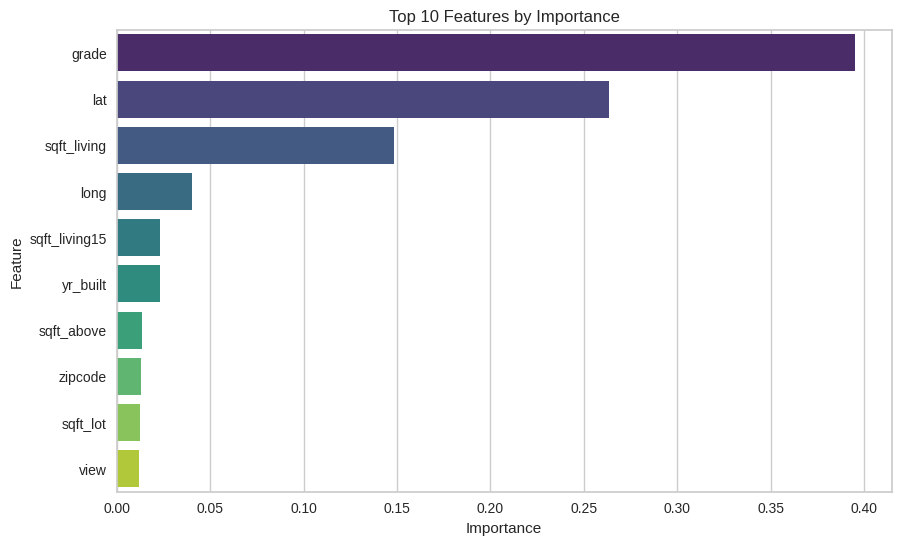

In [ ]:
plot_rf_feature_importances(rf, scaled_X_train.columns)

In [ ]:
xgb = XGBRegressor()
xgb.fit(scaled_X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
def plot_xgboost_feature_importances(model, importance_type='weight', max_num_features=6):

    importance = model.get_booster().get_score(importance_type=importance_type)
    sorted_importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)
    features, scores = zip(*sorted_importance[:max_num_features])

    # Plot the feature importances
    plt.figure(figsize=(10, 6))
    plt.barh(features, scores, color='skyblue')
    plt.xlabel(f'{importance_type.capitalize()} Importance')
    plt.title(f'Top {max_num_features} Feature Importances ({importance_type.capitalize()})')
    plt.gca().invert_yaxis()  # Invert y-axis to display the most important feature on top
    plt.show()

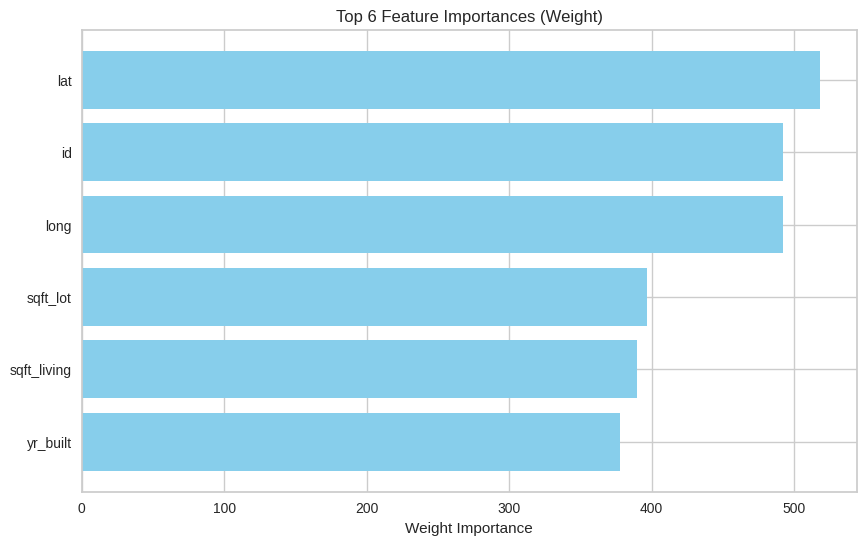

In [ ]:
plot_xgboost_feature_importances(xgb,importance_type='weight')

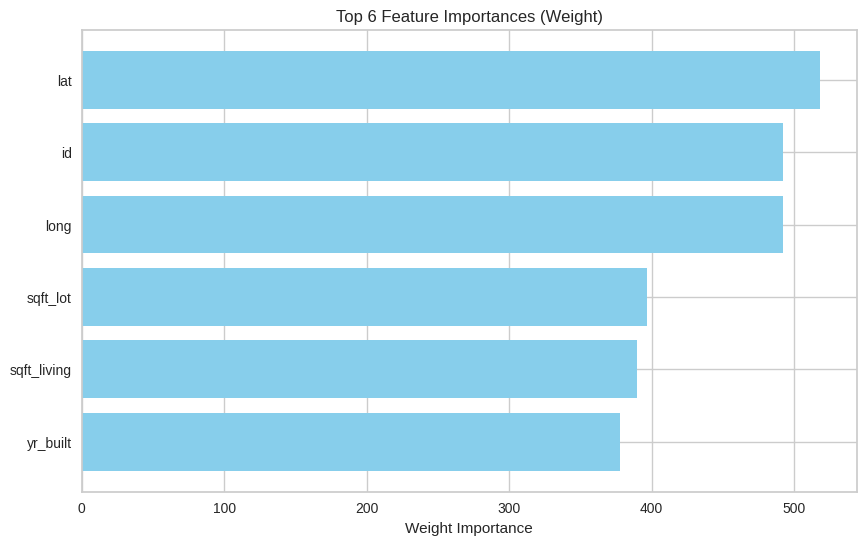

In [ ]:
plot_xgboost_feature_importances(xgb,importance_type='weight')

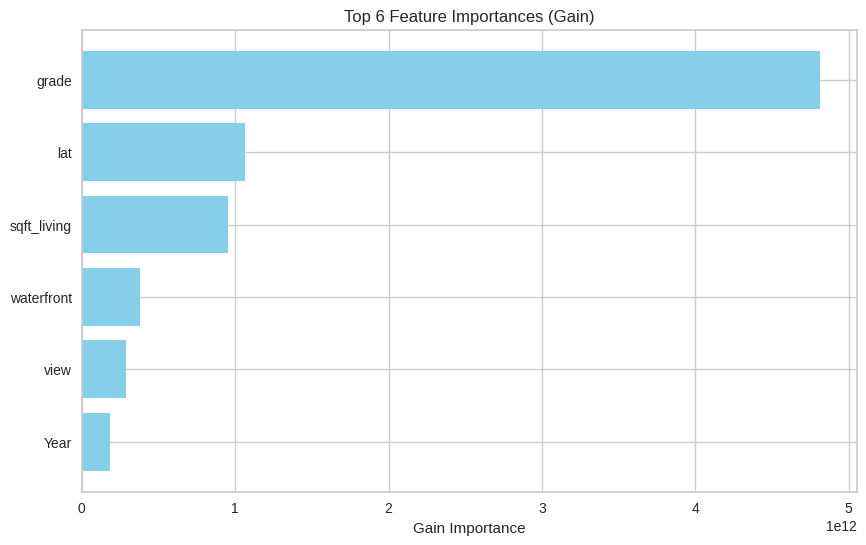

In [ ]:
plot_xgboost_feature_importances(xgb,importance_type='gain')

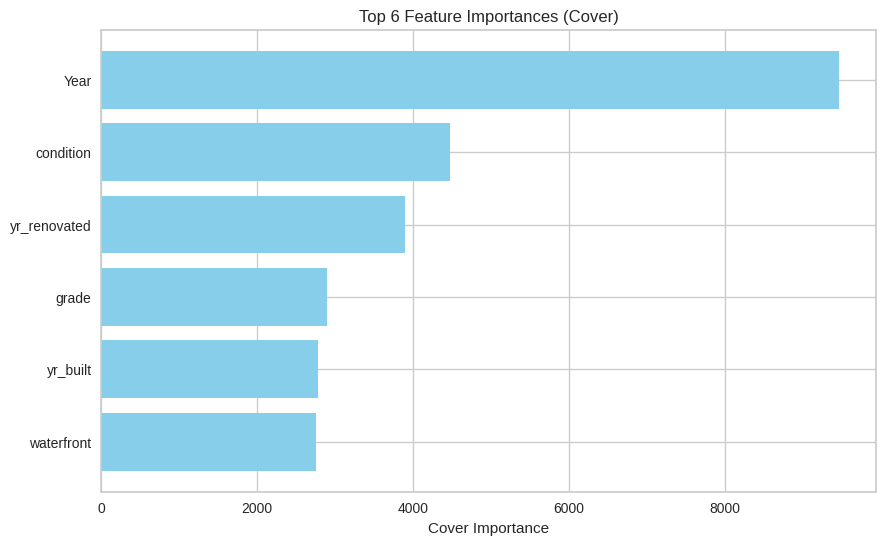

In [ ]:
plot_xgboost_feature_importances(xgb,importance_type='cover')

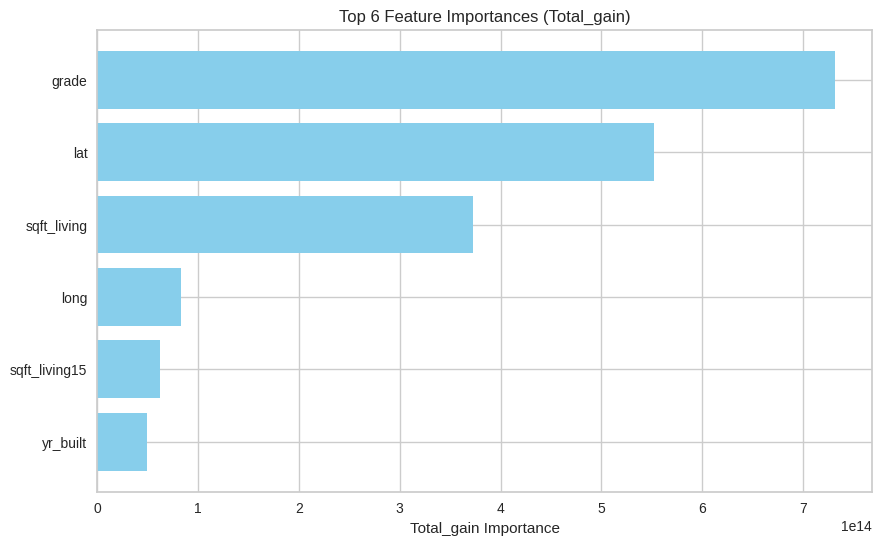

In [ ]:
plot_xgboost_feature_importances(xgb,importance_type='total_gain')

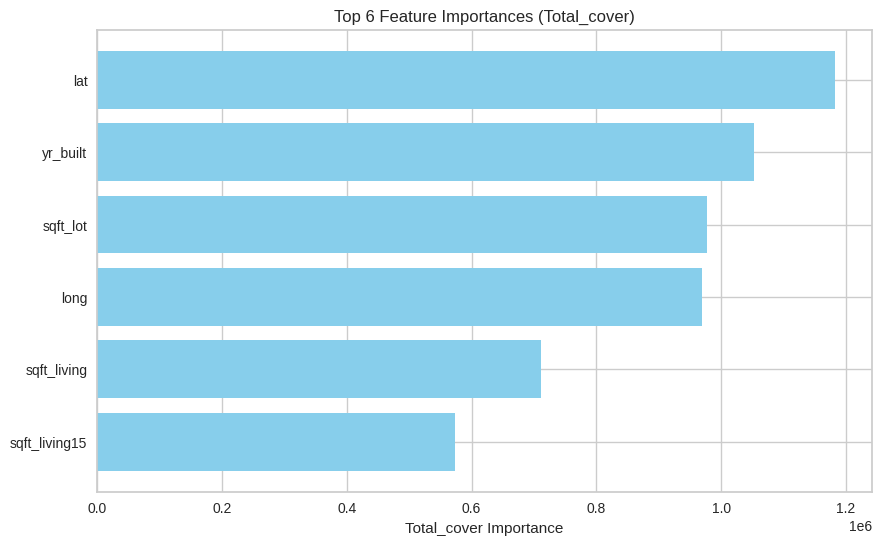

In [ ]:
plot_xgboost_feature_importances(xgb,importance_type='total_cover')

In [ ]:
final_selected_features = ['sqft_living','sqft_living15','grade','lat','long','yr_built']
final_X_train = scaled_X_train[final_selected_features]
final_X_test = scaled_X_test[final_selected_features]

In [ ]:
final_X_train.shape, final_X_test.shape

((17290, 6), (4323, 6))

## KNN (Function for selecting K)

In [ ]:
def train_and_evaluate_knn(X_train, y_train, X_test, y_test, k_values=[5, 10]):
    best_k = None
    best_accuracy = 0
    for k in k_values:
      model = KNeighborsClassifier(n_neighbors=k)
      model.fit(X_train, y_train)
      y_pred = model.predict(X_test)
      accuracy = accuracy_score(y_test, y_pred)
      print(f"K={k}")
      print(classification_report(y_test, y_pred))
    if accuracy > best_accuracy:
      best_accuracy = accuracy
    best_k = k
    print(f"\nBest K: {best_k}")
    return best_k

In [ ]:
best_k = train_and_evaluate_knn(final_X_train, y_train, final_X_test, y_test, k_values=[5, 10])

K=5
              precision    recall  f1-score   support

     81000.0       0.00      0.00      0.00         0
     82000.0       0.00      0.00      0.00         0
     82500.0       0.00      0.00      0.00         1
     83000.0       0.00      0.00      0.00         1
     84000.0       0.00      0.00      0.00         0
     85000.0       0.00      0.00      0.00         0
     86500.0       0.00      0.00      0.00         0
     89000.0       0.00      0.00      0.00         1
     89950.0       0.00      0.00      0.00         1
     90000.0       0.00      0.00      0.00         0
     92000.0       0.00      0.00      0.00         0
     95000.0       0.00      0.00      0.00         0
    100000.0       0.00      0.00      0.00         2
    102500.0       0.00      0.00      0.00         0
    104950.0       0.00      0.00      0.00         0
    105000.0       0.00      0.00      0.00         0
    107000.0       0.00      0.00      0.00         1
    109500.0       0.00

In [ ]:
def get_comparison(X_data, y_data, model_name, knn_model, linear_model, num_samples=2):
  num_rows = X_data.shape[0]
  idxes = [23, 46]
  samples = X_data.iloc[idxes]
  actual_values = y_data.iloc[idxes]
  # Select the model based on the model_name argument
  if model_name == 'knn':
    predictions = knn_model.predict(samples)
  elif model_name == 'linear':
    predictions = linear_model.predict(samples)
  else:
    raise ValueError("Invalid model name. Please choose 'knn' or 'linear'.")
  # Calculate the errors for the selected model
  errors = actual_values - predictions
  absolute_errors = np.abs(errors)
  comparison_df = pd.DataFrame({
    'Actual Value': actual_values,
    f'{model_name} Predicted Value': predictions,
    f'{model_name} Error': errors,
    f'{model_name} Absolute Error': absolute_errors
  })
  return comparison_df

In [ ]:
def get_random_comparison(X_data, y_data, knn_model, linear_model, num_samples=2):
  num_rows = X_data.shape[0]
  random_indices = np.random.choice(num_rows, size=num_samples, replace=False)
  random_samples = X_data.iloc[random_indices]
  actual_values = y_data.iloc[random_indices]
  knn_predictions = knn_model.predict(random_samples)
  linear_predictions = linear_model.predict(random_samples)
  comparison_df = pd.DataFrame({
    'Actual Value': actual_values,
    'KNN Predicted Value': knn_predictions,
    'Linear Regression Predicted Value': linear_predictions,
    'KNN Error': actual_values - knn_predictions,
    'Linear Regression Error': actual_values - linear_predictions,
    'KNN Absolute Error': np.abs(actual_values - knn_predictions),
    'Linear Regression Absolute Error': np.abs(actual_values - linear_predictions)
  })
  return comparison_df

As per the function best K came out to be 10

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=best_k, metric='manhattan')
knn_model.fit(final_X_train, y_train)

KNeighborsClassifier(metric='manhattan', n_neighbors=10)

In [ ]:
predicted_prices = knn_model.predict(final_X_test)

In [ ]:
linear_model1 = LinearRegression()
linear_model1.fit(final_X_train, y_train)

LinearRegression()

In [ ]:
linear_df = get_comparison(final_X_test, y_test, 'linear', knn_model, linear_model1)
linear_df

,Actual Value,linear Predicted Value,linear Error,linear Absolute Error
7609,560000.0,783598.961613,-223598.961613,223598.961613
12909,334009.0,406395.020147,-72386.020147,72386.020147


In [ ]:
knn_df = get_comparison(final_X_test, y_test, 'knn', knn_model, linear_model1)
knn_df

,Actual Value,knn Predicted Value,knn Error,knn Absolute Error
7609,560000.0,440000.0,120000.0,120000.0
12909,334009.0,279900.0,54109.0,54109.0


In [ ]:
comparison_df = get_random_comparison(final_X_test, y_test, knn_model, linear_model1)
comparison_df

,Actual Value,KNN Predicted Value,Linear Regression Predicted Value,KNN Error,Linear Regression Error,KNN Absolute Error,Linear Regression Absolute Error
718,730000.0,430000.0,624725.389775,300000.0,105274.610225,300000.0,105274.610225
16360,600000.0,525000.0,745755.611016,75000.0,-145755.611016,75000.0,145755.611016


# Model Training and Evaluation

In [ ]:
model_names = []
r2_scores = []
mae_scores = []
mse_scores = []
rmse_scores = []
mape_scores = []

In [ ]:
def train_and_evaluate_model(model, X_train, y_train, X_test, y_test):

    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)

     # Extract model name
    if isinstance(model, RandomizedSearchCV):
        base_model = model.best_estimator_
        model_name = re.findall(r'[A-Za-z]+', str(type(base_model)))[-1]
        model_name = "RandomizedSearchCV(" + model_name + ")"
    else:
        model_name = re.findall(r'[A-Za-z]+', str(type(model)))[-1]

    model_names.append(model_name)
    print('Training Data statistics')
    regressionSummary(y_train, y_train_pred)
    print('\nTesting Data statistics')
    regressionSummary(y_test, y_test_pred)

    print('\n\n')

    r2 = r2_score(y_test, y_test_pred)
    mae = mean_absolute_error(y_test, y_test_pred)
    mse = mean_squared_error(y_test, y_test_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_test, y_test_pred)

    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mape_scores.append(mape)

    print(f'R2 Score: {r2}')
    print(f'MAE: {mae}')
    print(f'MSE: {mse}')
    print(f'RMSE: {rmse}')
    print(f'MAPE: {mape}')

    print('\n\n')

    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_test_pred, alpha=0.6, color='blue')
    plt.plot([min(y_test), max(y_test)],
             [min(y_test), max(y_test)],
             linestyle='--', color='red', linewidth=2)
    plt.xlabel("Actual House Prices")
    plt.ylabel("Predicted House Prices")
    plt.title(f"Actual vs. Predicted Prices for {model_name}")
    plt.show()

    residuals = y_test - y_test_pred

    plt.figure(figsize=(8, 6))
    sns.histplot(residuals, bins=50, kde=True, color='blue')
    plt.axvline(x=0, color='red', linestyle='--', label='Zero Residual')
    plt.xlabel("Residuals (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.title(f"Residual Distribution for {model_name}")
    plt.legend()
    plt.show()

    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, residuals, alpha=0.6, color='blue')
    plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
    plt.xlabel("Actual House Prices")
    plt.ylabel("Residuals (Actual - Predicted)")
    plt.title(f"Residuals Plot for {model_name}")
    plt.show()

    gc.collect()

# Linear Regression

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 131443.4244
            Mean Absolute Error (MAE) : 100866.1923
          Mean Percentage Error (MPE) : -5.7022
Mean Absolute Percentage Error (MAPE) : 22.5155

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 1990.2789
       Root Mean Squared Error (RMSE) : 132544.7489
            Mean Absolute Error (MAE) : 101309.3180
          Mean Percentage Error (MPE) : -5.3312
Mean Absolute Percentage Error (MAPE) : 22.3566



R2 Score: 0.726193334816341
MAE: 101309.31799043747
MSE: 17568110460.309715
RMSE: 132544.74889753165
MAPE: 0.22356645488880902





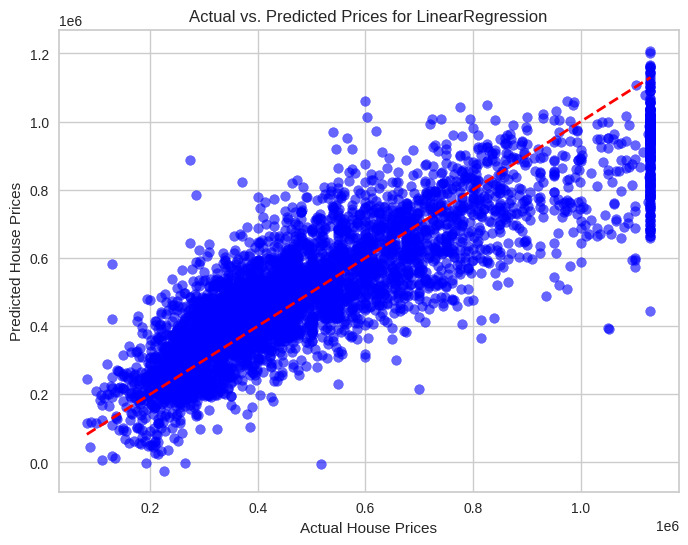

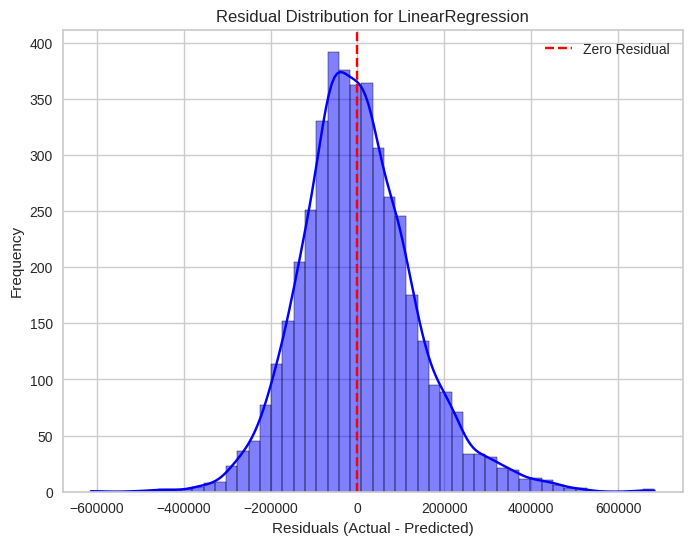

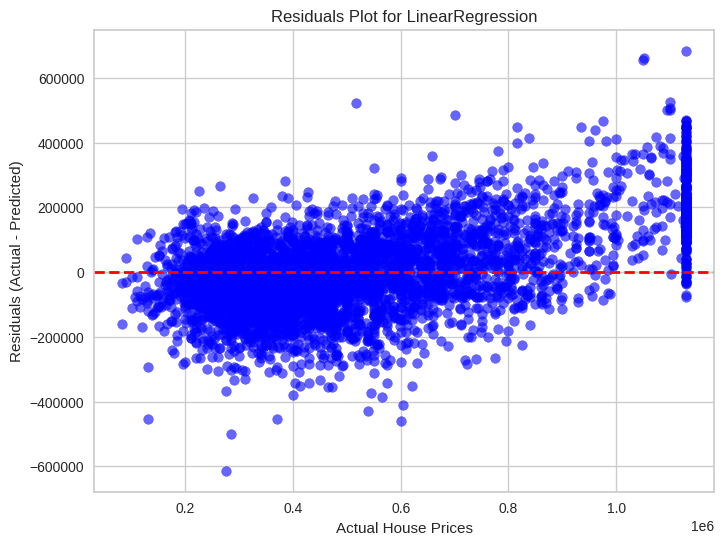

In [ ]:
train_and_evaluate_model(LinearRegression(), final_X_train, y_train, final_X_test, y_test)

# Decision Tree Rregressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 9983.1473
            Mean Absolute Error (MAE) : 978.4222
          Mean Percentage Error (MPE) : -0.0898
Mean Absolute Percentage Error (MAPE) : 0.3153

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 1760.5008
       Root Mean Squared Error (RMSE) : 119129.2147
            Mean Absolute Error (MAE) : 80502.4194
          Mean Percentage Error (MPE) : -2.5458
Mean Absolute Percentage Error (MAPE) : 17.7073



R2 Score: 0.7788150768595836
MAE: 80502.41942324003
MSE: 14191769799.612082
RMSE: 119129.21471919506
MAPE: 0.1770725935251293





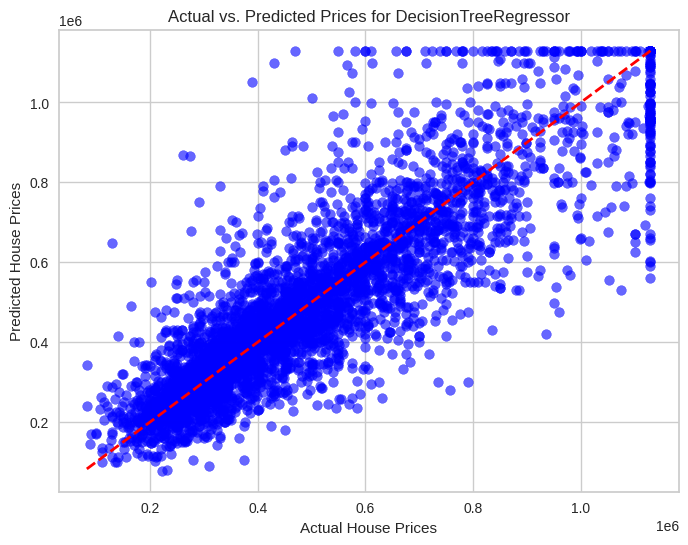

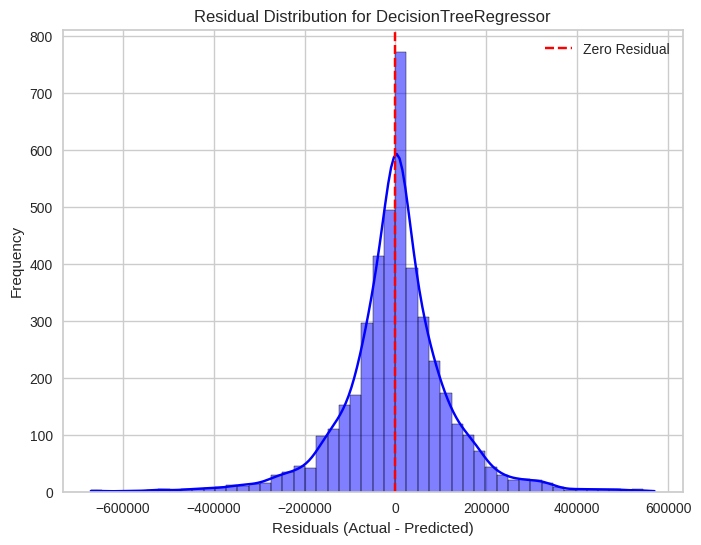

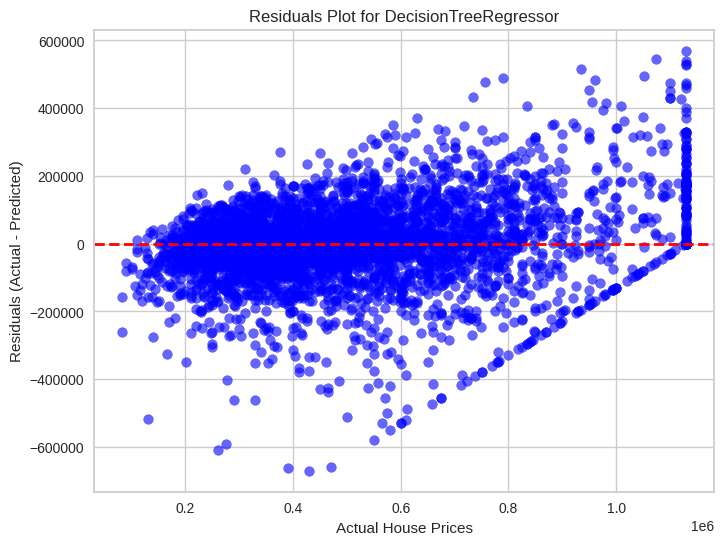

In [ ]:
train_and_evaluate_model(DecisionTreeRegressor(), final_X_train, y_train, final_X_test, y_test)

# Random Forest Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 14.4299
       Root Mean Squared Error (RMSE) : 33660.3276
            Mean Absolute Error (MAE) : 22158.8796
          Mean Percentage Error (MPE) : -1.1834
Mean Absolute Percentage Error (MAPE) : 4.9369

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2327.1597
       Root Mean Squared Error (RMSE) : 87929.6763
            Mean Absolute Error (MAE) : 59889.7665
          Mean Percentage Error (MPE) : -2.5717
Mean Absolute Percentage Error (MAPE) : 12.9372



R2 Score: 0.8794992052276813
MAE: 59889.76651953559
MSE: 7731627978.067018
RMSE: 87929.67632185972
MAPE: 0.1293719268359523





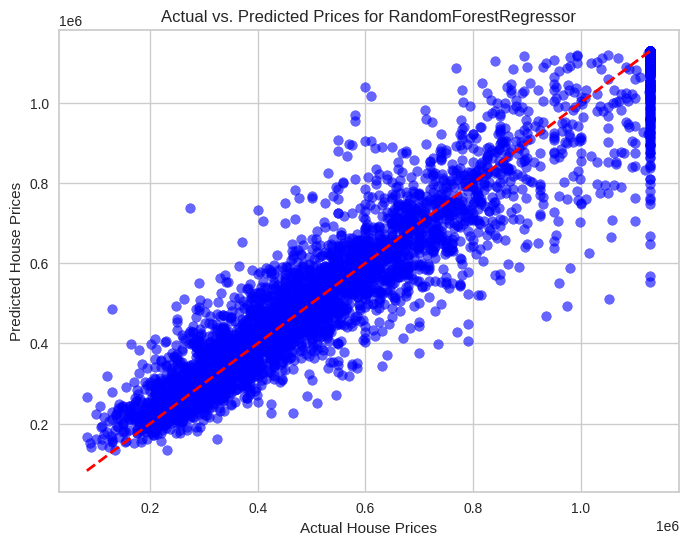

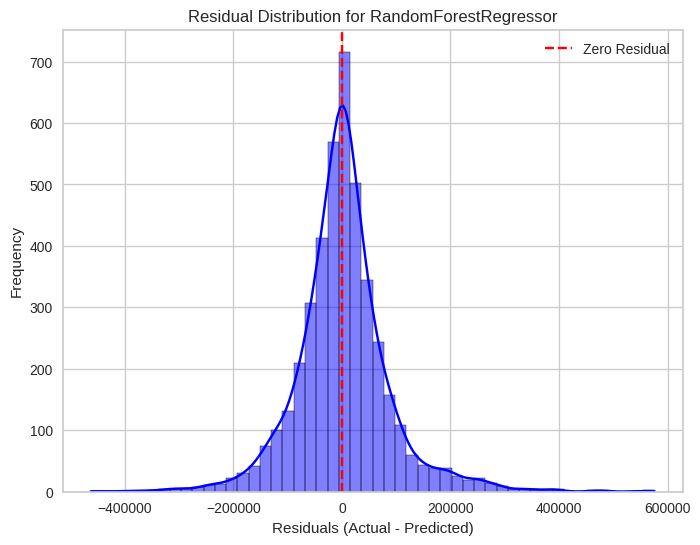

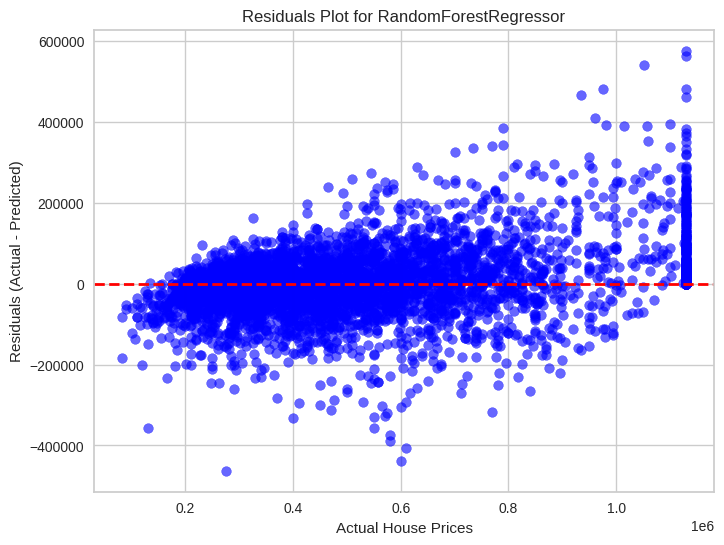

In [ ]:
train_and_evaluate_model(RandomForestRegressor(), final_X_train, y_train, final_X_test, y_test)

# XGB Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 2.3285
       Root Mean Squared Error (RMSE) : 57734.0913
            Mean Absolute Error (MAE) : 41116.2542
          Mean Percentage Error (MPE) : -1.9221
Mean Absolute Percentage Error (MAPE) : 9.3789

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2272.0132
       Root Mean Squared Error (RMSE) : 87616.6987
            Mean Absolute Error (MAE) : 60219.0244
          Mean Percentage Error (MPE) : -2.4483
Mean Absolute Percentage Error (MAPE) : 12.9543



R2 Score: 0.8803555016299349
MAE: 60219.024427842356
MSE: 7676685890.475884
RMSE: 87616.69869651496
MAPE: 0.12954339536378612





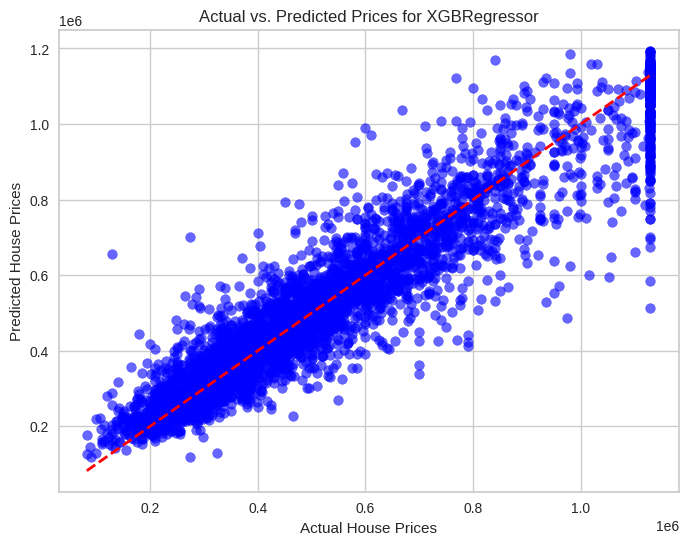

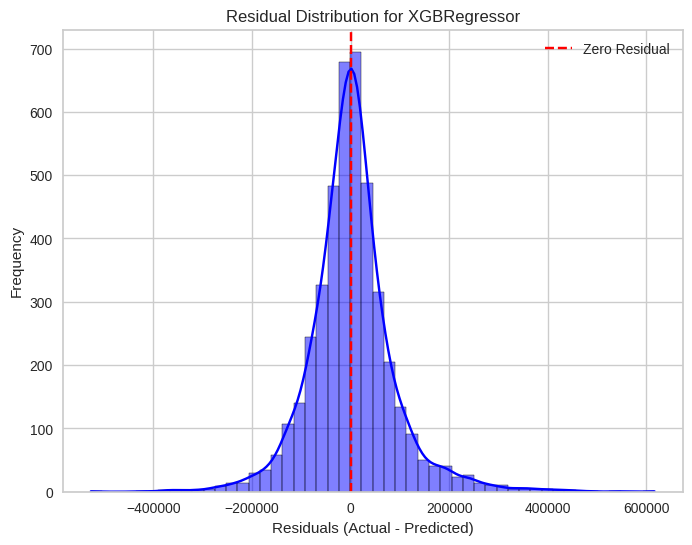

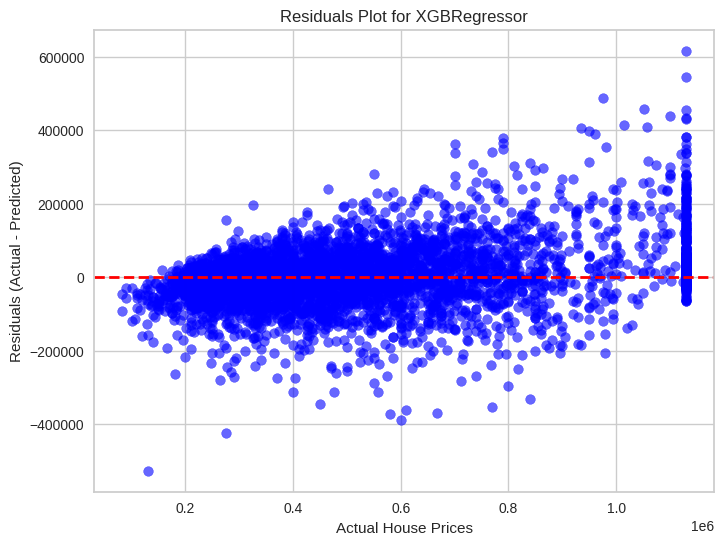

In [ ]:
train_and_evaluate_model(XGBRegressor(), final_X_train, y_train, final_X_test, y_test)

## Support Vector Regressor (SVR)

Training Data statistics

Regression statistics

                      Mean Error (ME) : 60256.5415
       Root Mean Squared Error (RMSE) : 255287.9548
            Mean Absolute Error (MAE) : 191496.8957
          Mean Percentage Error (MPE) : -11.1085
Mean Absolute Percentage Error (MAPE) : 41.7394

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 66289.3107
       Root Mean Squared Error (RMSE) : 260783.9437
            Mean Absolute Error (MAE) : 195818.5226
          Mean Percentage Error (MPE) : -10.0490
Mean Absolute Percentage Error (MAPE) : 41.6983



R2 Score: -0.05993848129553081
MAE: 195818.52255130382
MSE: 68008265277.40834
RMSE: 260783.94367255116
MAPE: 0.41698297369880877





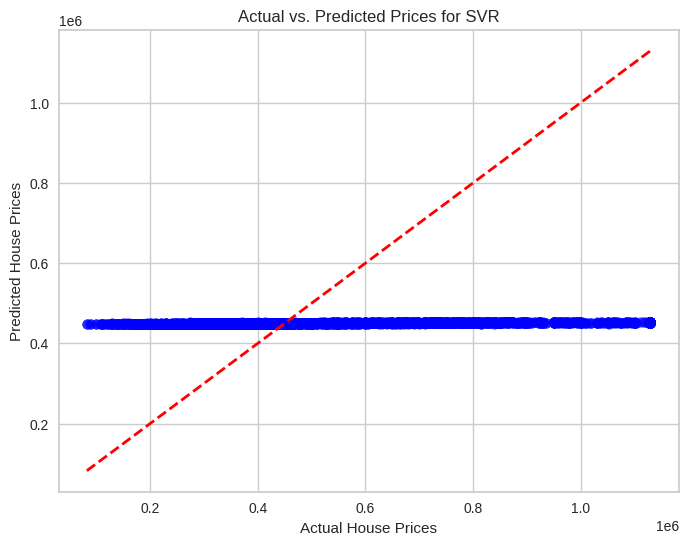

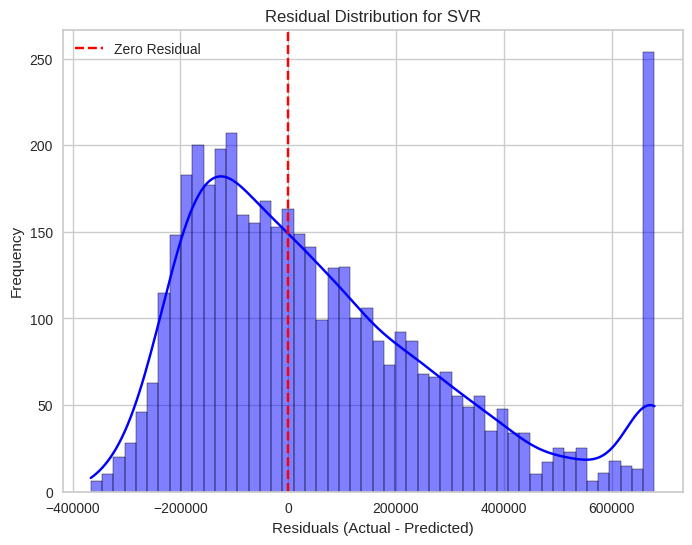

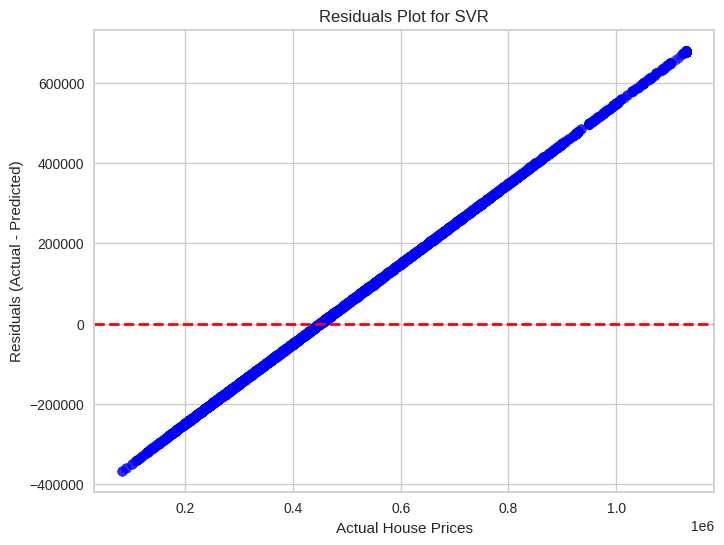

In [ ]:
train_and_evaluate_model(SVR(), final_X_train, y_train, final_X_test, y_test)

## Adaptive Boosting Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : -58450.6888
       Root Mean Squared Error (RMSE) : 133446.1778
            Mean Absolute Error (MAE) : 111870.7193
          Mean Percentage Error (MPE) : -22.2628
Mean Absolute Percentage Error (MAPE) : 28.2456

Testing Data statistics

Regression statistics

                      Mean Error (ME) : -53913.8103
       Root Mean Squared Error (RMSE) : 132850.9158
            Mean Absolute Error (MAE) : 110860.1858
          Mean Percentage Error (MPE) : -21.2030
Mean Absolute Percentage Error (MAPE) : 27.5322



R2 Score: 0.7249269343634613
MAE: 110860.18582680158
MSE: 17649365834.528793
RMSE: 132850.91582118956
MAPE: 0.27532165388278645





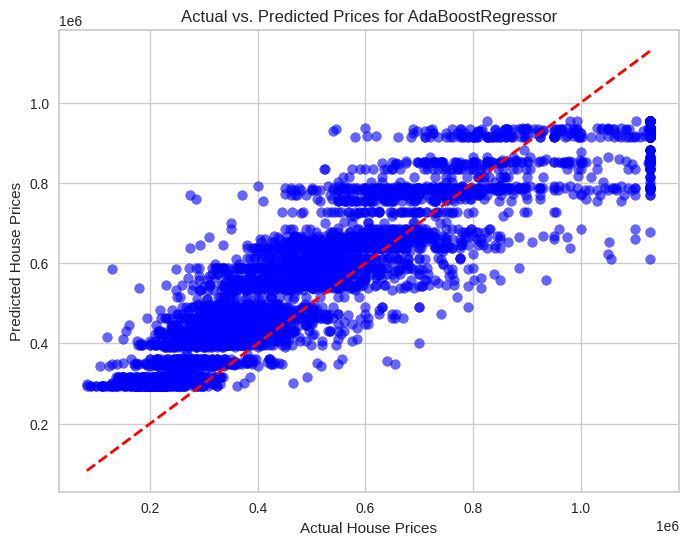

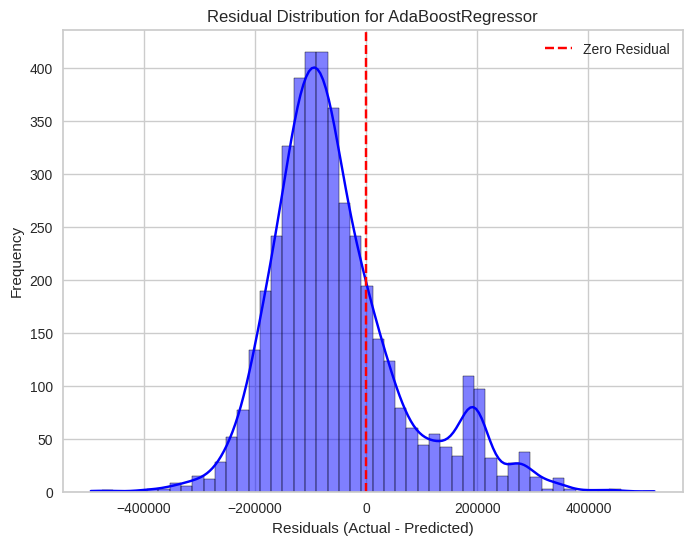

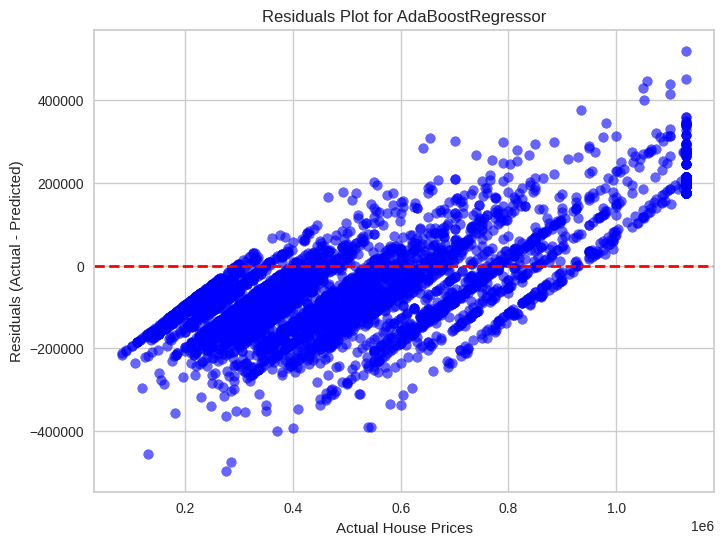

In [ ]:
train_and_evaluate_model(AdaBoostRegressor(), final_X_train, y_train, final_X_test, y_test)

## Gradient Boosting Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 90890.4639
            Mean Absolute Error (MAE) : 64056.3776
          Mean Percentage Error (MPE) : -3.6440
Mean Absolute Percentage Error (MAPE) : 13.9925

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2760.0167
       Root Mean Squared Error (RMSE) : 95363.5967
            Mean Absolute Error (MAE) : 67480.4888
          Mean Percentage Error (MPE) : -3.2310
Mean Absolute Percentage Error (MAPE) : 14.4358



R2 Score: 0.8582626832093057
MAE: 67480.48876099216
MSE: 9094215570.160046
RMSE: 95363.59667168623
MAPE: 0.14435831467411112





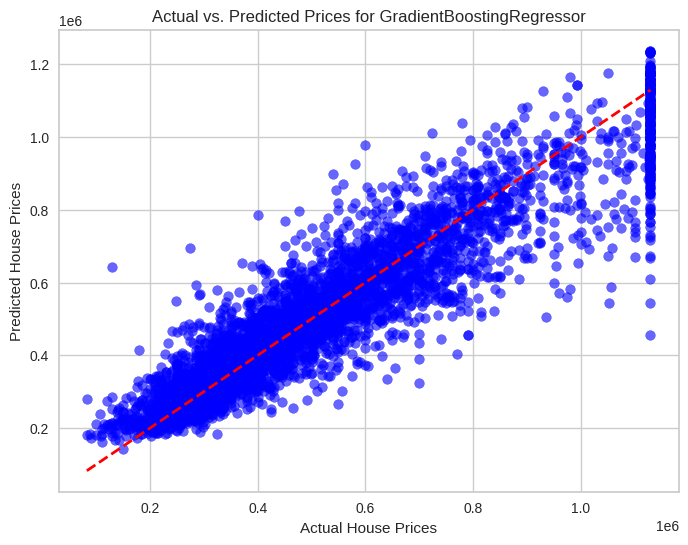

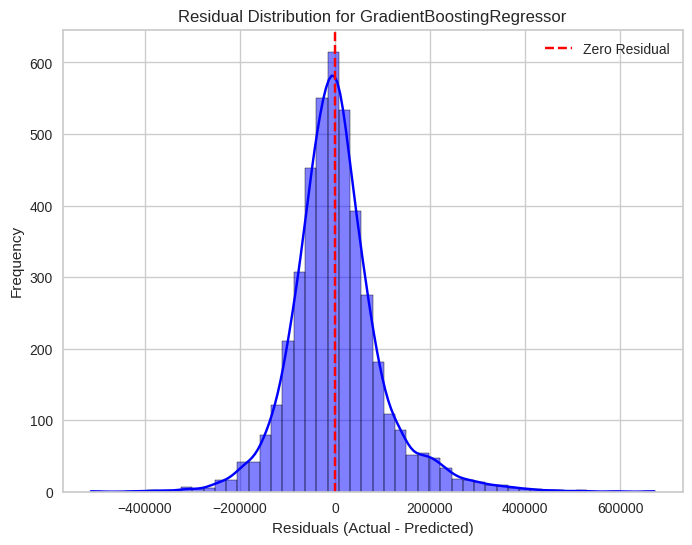

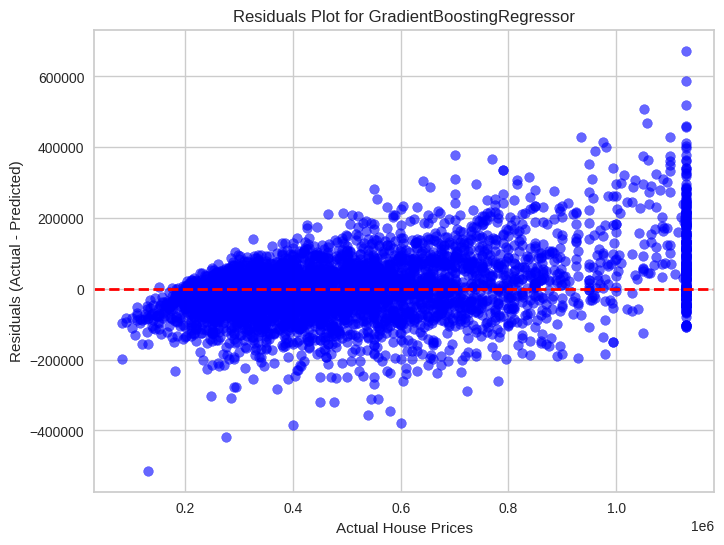

In [ ]:
train_and_evaluate_model(GradientBoostingRegressor(), final_X_train, y_train, final_X_test, y_test)

## Extra Trees Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 9983.8378
            Mean Absolute Error (MAE) : 981.0659
          Mean Percentage Error (MPE) : -0.0898
Mean Absolute Percentage Error (MAPE) : 0.3158

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 3157.4706
       Root Mean Squared Error (RMSE) : 89910.1752
            Mean Absolute Error (MAE) : 60987.8806
          Mean Percentage Error (MPE) : -2.4814
Mean Absolute Percentage Error (MAPE) : 13.1309



R2 Score: 0.8740098333570588
MAE: 60987.880612614696
MSE: 8083839606.356362
RMSE: 89910.17521035293
MAPE: 0.13130852933307213





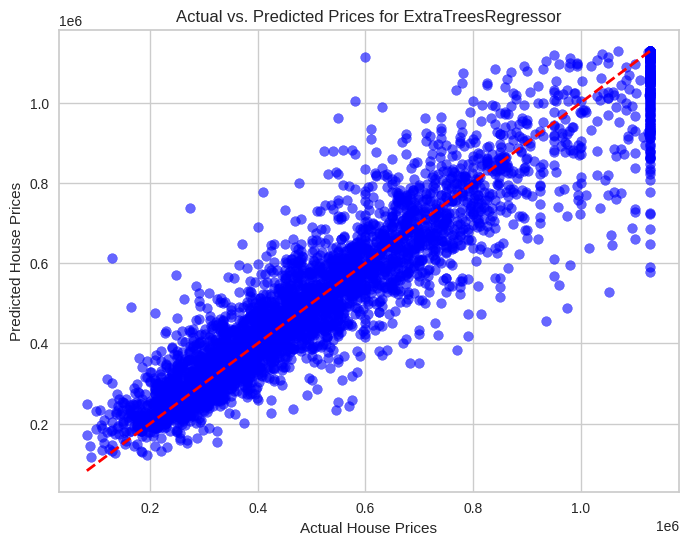

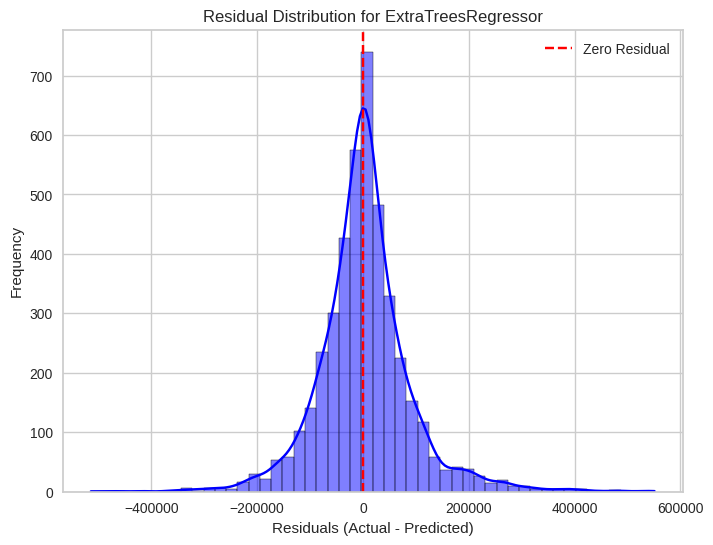

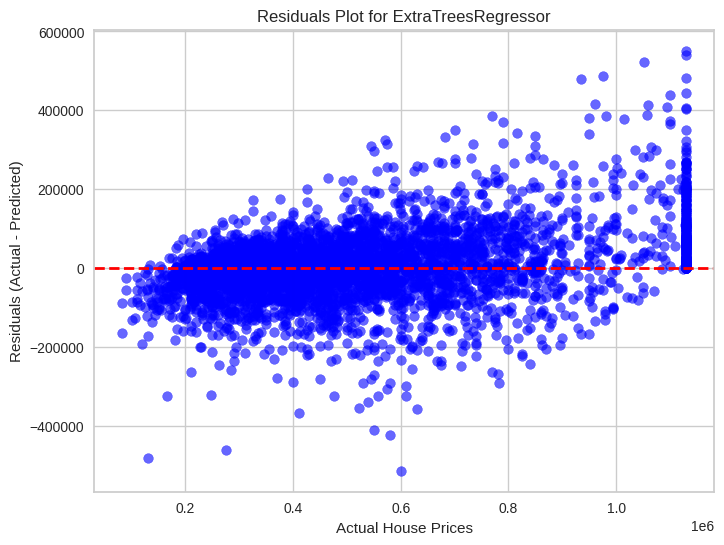

In [ ]:
train_and_evaluate_model(ExtraTreesRegressor(), final_X_train, y_train, final_X_test, y_test)

## Histogram Gradient Boosting Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 264.8120
       Root Mean Squared Error (RMSE) : 74858.4057
            Mean Absolute Error (MAE) : 51784.2159
          Mean Percentage Error (MPE) : -2.7367
Mean Absolute Percentage Error (MAPE) : 11.6167

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2747.3156
       Root Mean Squared Error (RMSE) : 85945.0142
            Mean Absolute Error (MAE) : 59225.7729
          Mean Percentage Error (MPE) : -2.5624
Mean Absolute Percentage Error (MAPE) : 12.7802



R2 Score: 0.8848774667564447
MAE: 59225.77290652793
MSE: 7386545463.1531725
RMSE: 85945.01418437938
MAPE: 0.12780191460903578





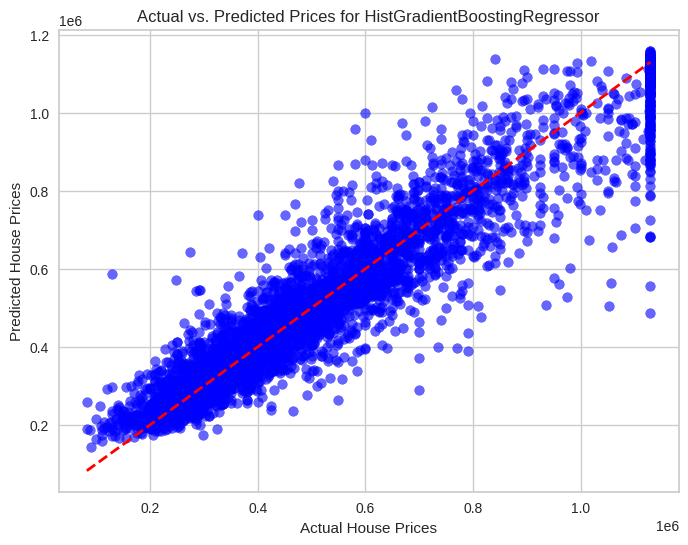

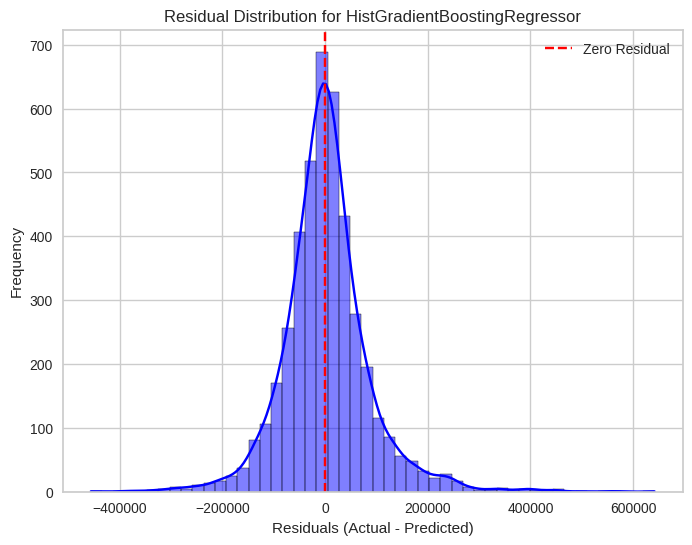

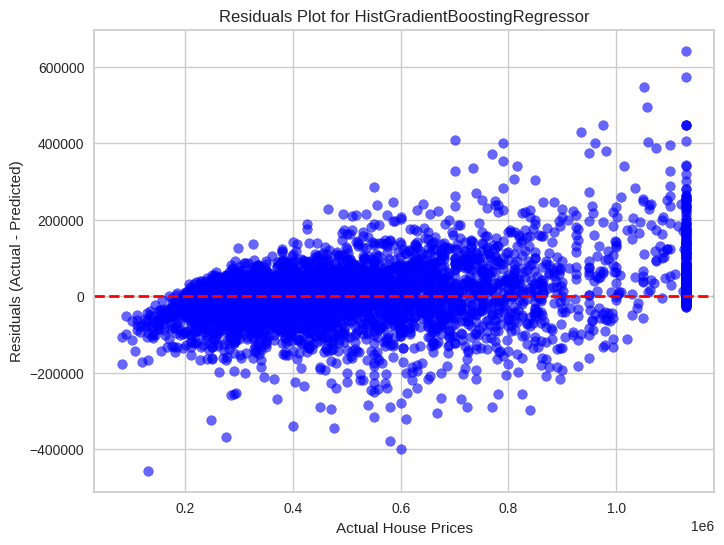

In [ ]:
train_and_evaluate_model(HistGradientBoostingRegressor(), final_X_train, y_train, final_X_test, y_test)

## Cat Boost Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 8.7750
       Root Mean Squared Error (RMSE) : 68566.3056
            Mean Absolute Error (MAE) : 48084.4252
          Mean Percentage Error (MPE) : -2.4477
Mean Absolute Percentage Error (MAPE) : 10.7769

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2643.6540
       Root Mean Squared Error (RMSE) : 83429.0400
            Mean Absolute Error (MAE) : 57425.5157
          Mean Percentage Error (MPE) : -2.3554
Mean Absolute Percentage Error (MAPE) : 12.3813



R2 Score: 0.8915190562827131
MAE: 57425.515659042016
MSE: 6960404710.329446
RMSE: 83429.03997008143
MAPE: 0.12381261427847956





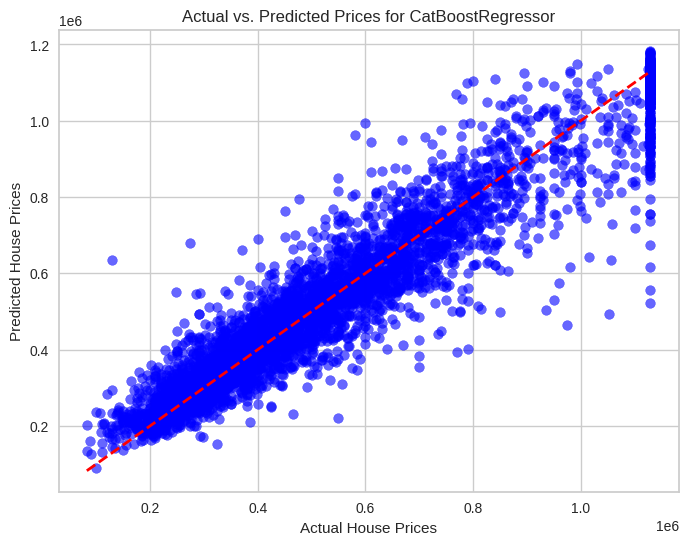

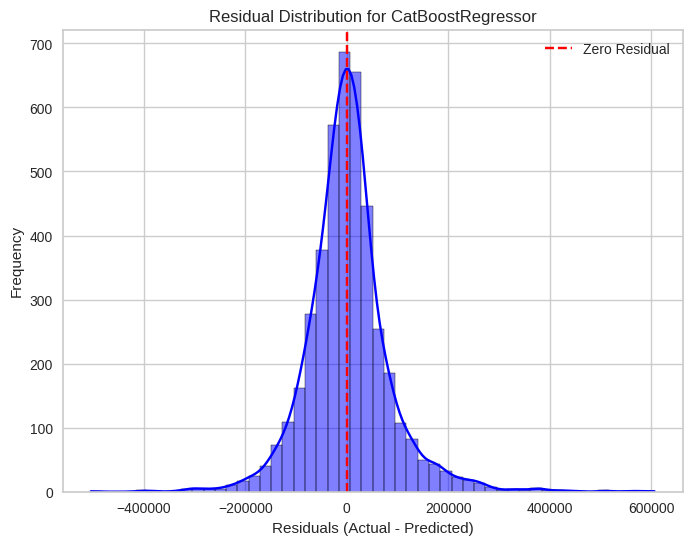

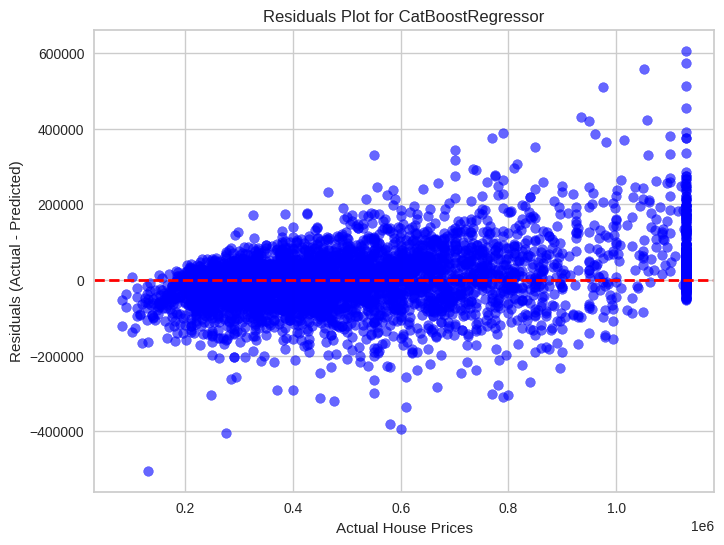

In [ ]:
train_and_evaluate_model(CatBoostRegressor(silent=True), final_X_train, y_train, final_X_test, y_test)

## Light GBM Regressor

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1140
[LightGBM] [Info] Number of data points in the train set: 17290, number of used features: 6
[LightGBM] [Info] Start training from score 510377.532620
Training Data statistics

Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 73854.5588
            Mean Absolute Error (MAE) : 51434.7446
          Mean Percentage Error (MPE) : -2.7616
Mean Absolute Percentage Error (MAPE) : 11.5447

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2584.6524
       Root Mean Squared Error (RMSE) : 86334.3008
            Mean Absolute Error (MAE) : 59512.8923
          Mean Percentage Error (MPE) : -2.5939
Mean Absolute Percentage Error (MAPE) : 12.8157



R2 Score: 0.8838322134817066
MAE: 59512.89231588074
MSE: 745

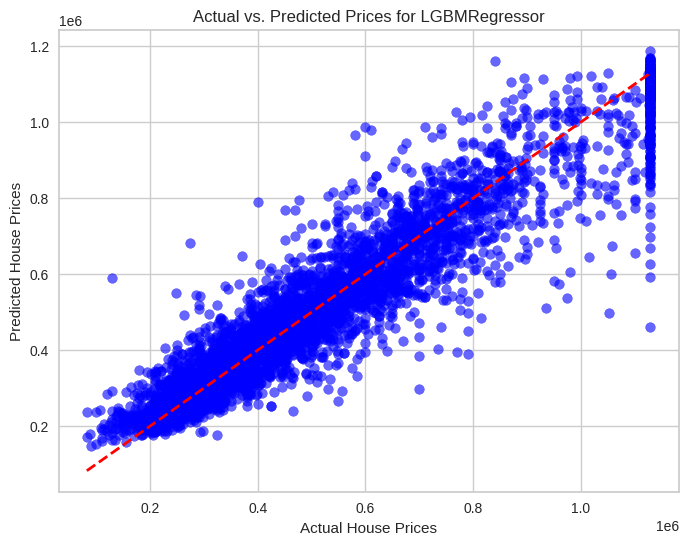

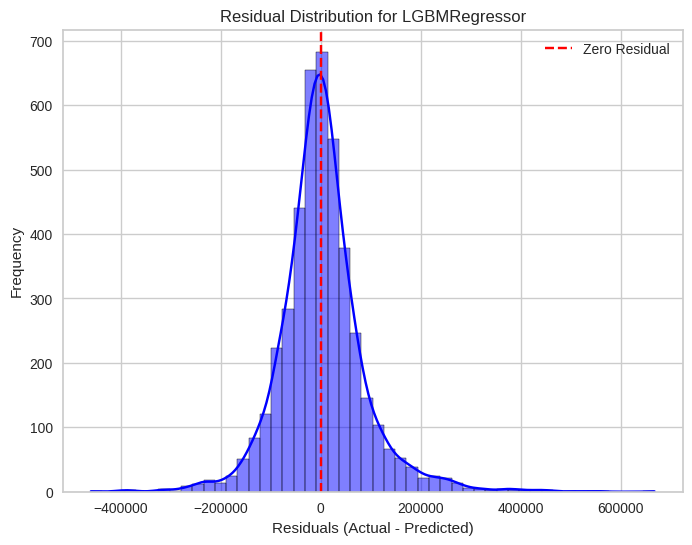

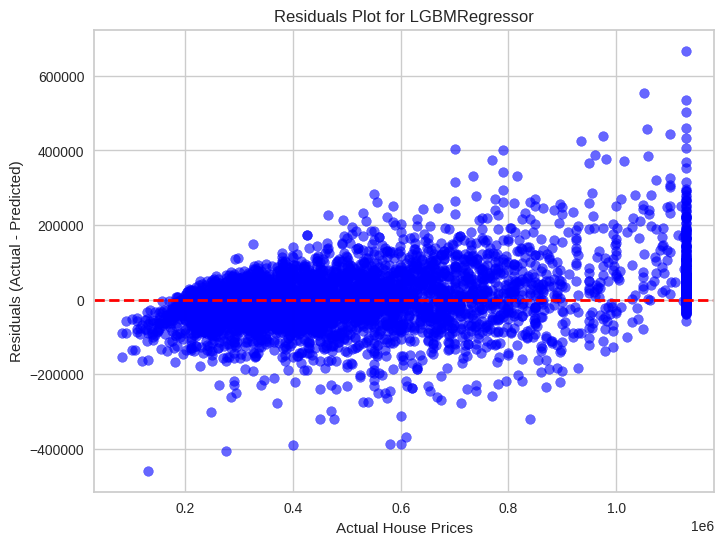

In [ ]:
train_and_evaluate_model(LGBMRegressor(), final_X_train, y_train, final_X_test, y_test)

## XGBoost Random Forest Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : -14.2219
       Root Mean Squared Error (RMSE) : 100905.0585
            Mean Absolute Error (MAE) : 71875.8208
          Mean Percentage Error (MPE) : -5.3784
Mean Absolute Percentage Error (MAPE) : 16.0125

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 3497.5186
       Root Mean Squared Error (RMSE) : 106166.2373
            Mean Absolute Error (MAE) : 75663.1584
          Mean Percentage Error (MPE) : -4.8342
Mean Absolute Percentage Error (MAPE) : 16.4517



R2 Score: 0.8243323412516335
MAE: 75663.1584186329
MSE: 11271269934.664396
RMSE: 106166.23726338048
MAPE: 0.1645172155288405





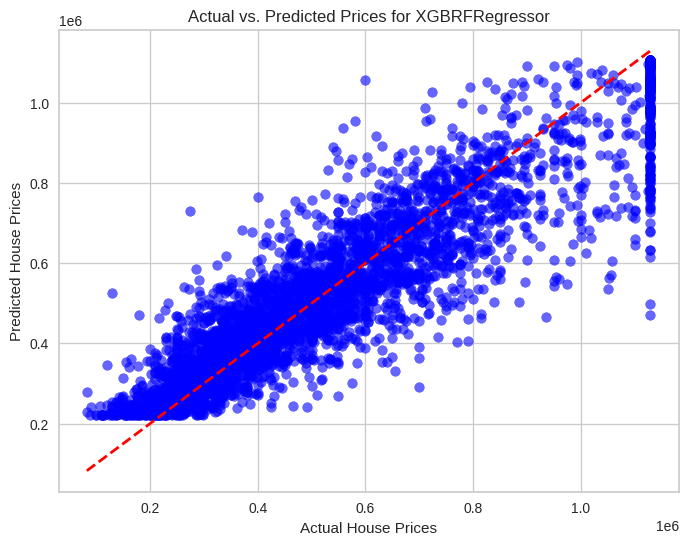

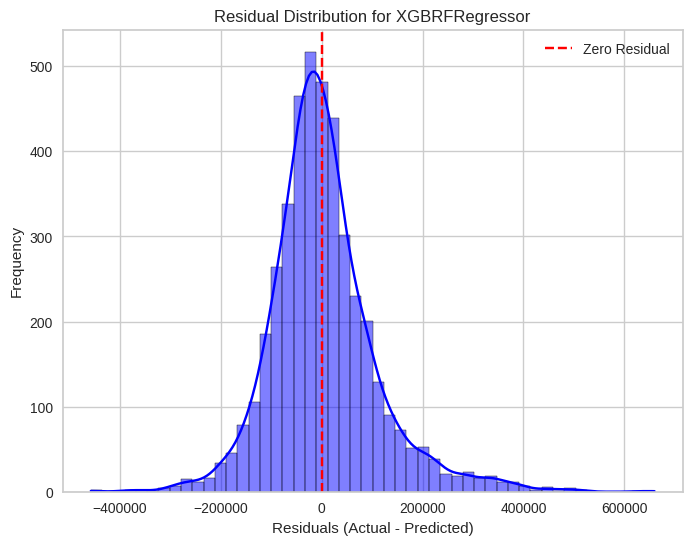

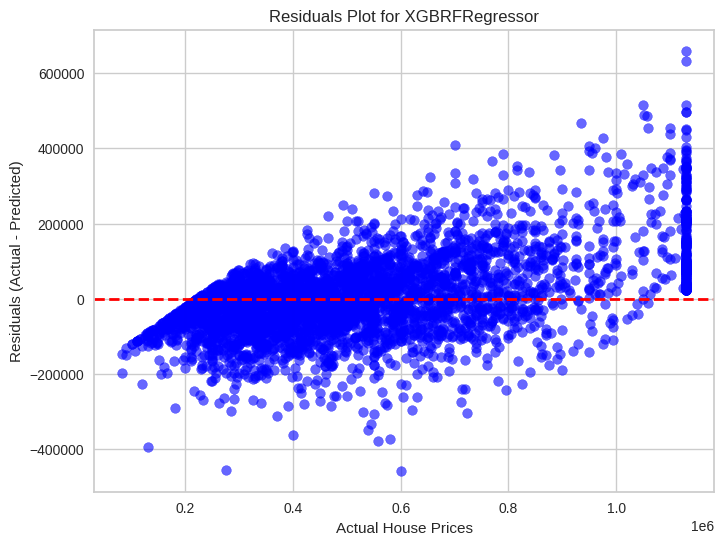

In [ ]:
train_and_evaluate_model(XGBRFRegressor(), final_X_train, y_train, final_X_test, y_test)

## Bagging Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : -138.1295
       Root Mean Squared Error (RMSE) : 39270.2584
            Mean Absolute Error (MAE) : 24888.6947
          Mean Percentage Error (MPE) : -1.1924
Mean Absolute Percentage Error (MAPE) : 5.5152

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2033.7646
       Root Mean Squared Error (RMSE) : 91441.9993
            Mean Absolute Error (MAE) : 62445.2279
          Mean Percentage Error (MPE) : -2.5100
Mean Absolute Percentage Error (MAPE) : 13.4202



R2 Score: 0.8696802049801873
MAE: 62445.22793033937
MSE: 8361639233.790385
RMSE: 91441.99928802074
MAPE: 0.13420208870428782





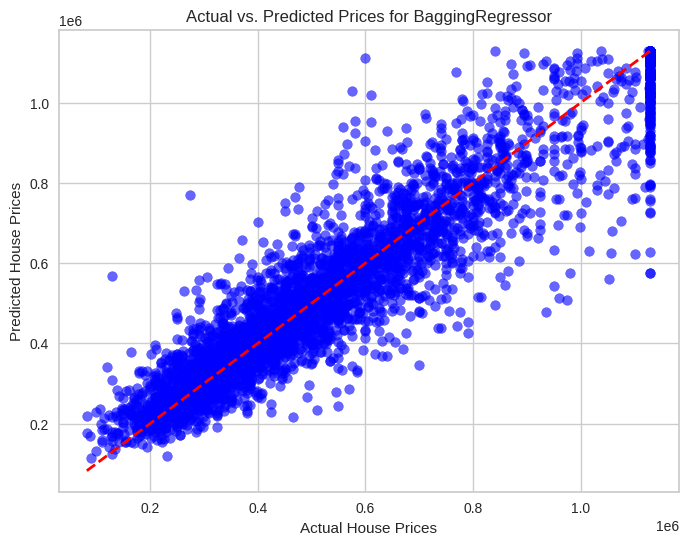

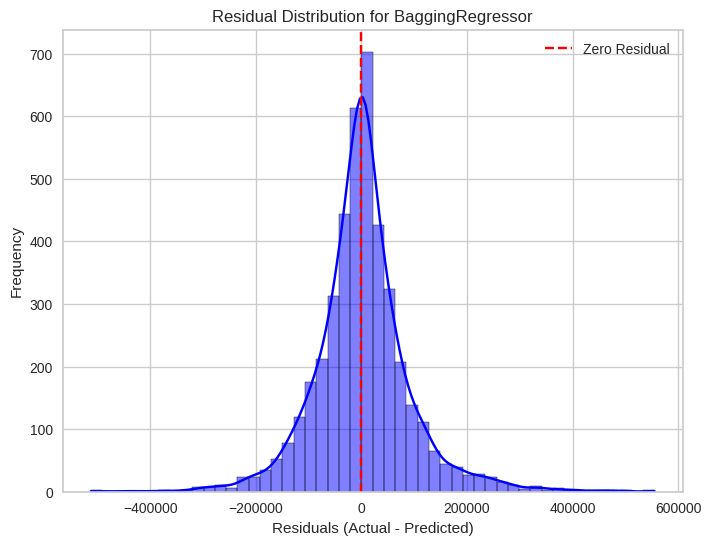

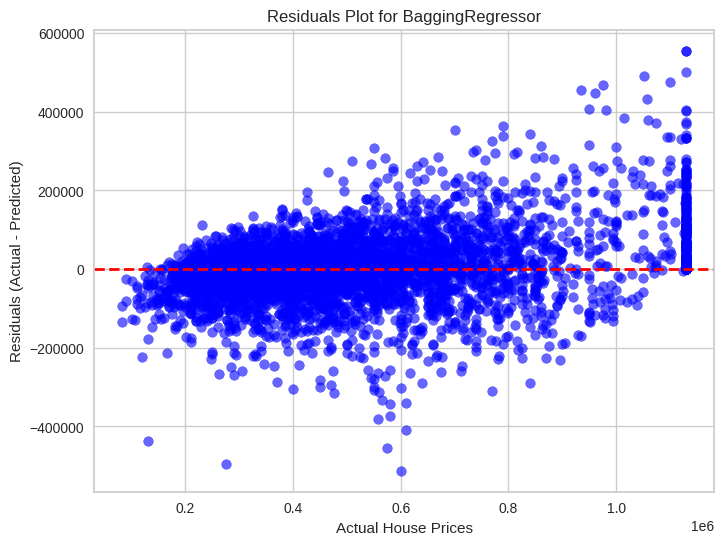

In [ ]:
train_and_evaluate_model(BaggingRegressor(), final_X_train, y_train, final_X_test, y_test)

## K Nearest Neighbors Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 1979.5264
       Root Mean Squared Error (RMSE) : 79402.4923
            Mean Absolute Error (MAE) : 53656.4122
          Mean Percentage Error (MPE) : -2.1974
Mean Absolute Percentage Error (MAPE) : 11.6463

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 5306.4168
       Root Mean Squared Error (RMSE) : 98205.3761
            Mean Absolute Error (MAE) : 66890.0379
          Mean Percentage Error (MPE) : -2.1693
Mean Absolute Percentage Error (MAPE) : 14.2502



R2 Score: 0.8496894412568837
MAE: 66890.03789035392
MSE: 9644295903.383791
RMSE: 98205.376142978
MAPE: 0.1425023071865045





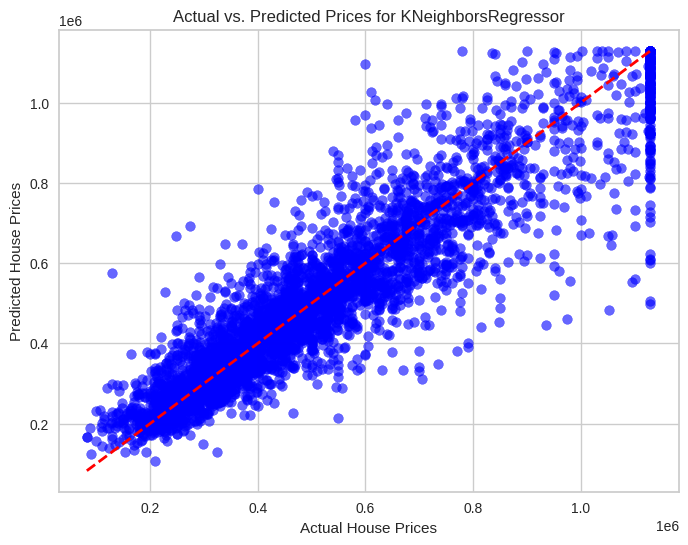

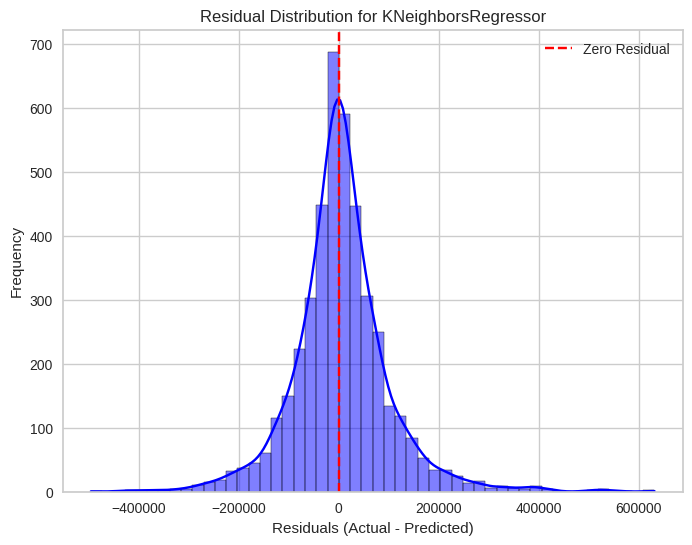

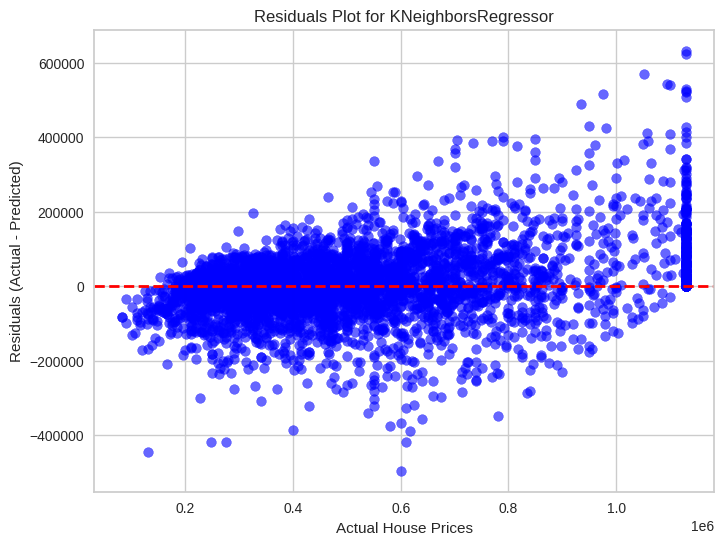

In [ ]:
train_and_evaluate_model(KNeighborsRegressor(), final_X_train, y_train, final_X_test, y_test)

## Stochastic Gradient Descent (SGD) Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 1481.2542
       Root Mean Squared Error (RMSE) : 131462.5712
            Mean Absolute Error (MAE) : 100809.3986
          Mean Percentage Error (MPE) : -5.3874
Mean Absolute Percentage Error (MAPE) : 22.4472

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 3487.9061
       Root Mean Squared Error (RMSE) : 132578.1649
            Mean Absolute Error (MAE) : 101285.8358
          Mean Percentage Error (MPE) : -5.0175
Mean Absolute Percentage Error (MAPE) : 22.2983



R2 Score: 0.7260552579110576
MAE: 101285.83578910724
MSE: 17576969814.85614
RMSE: 132578.16492490814
MAPE: 0.22298292251994653





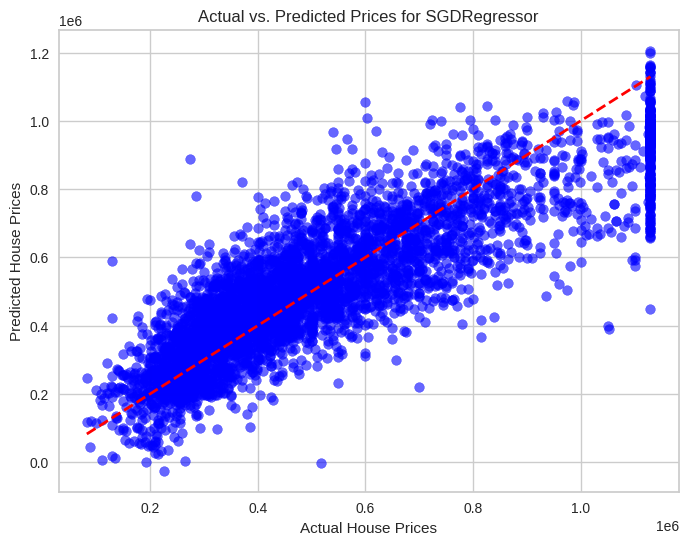

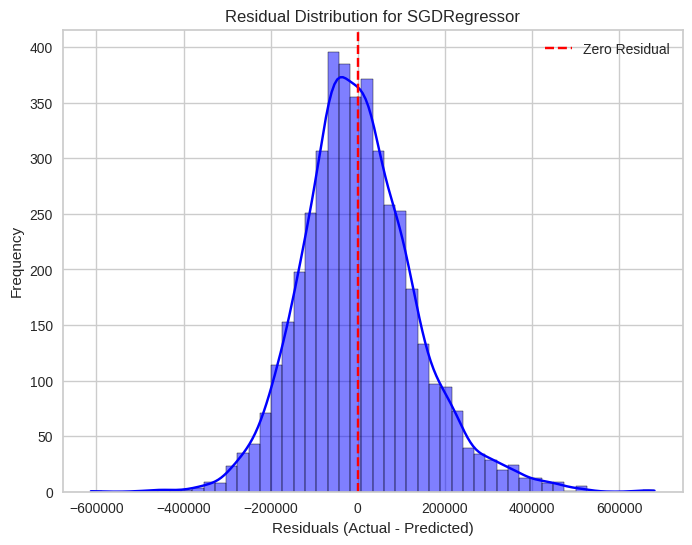

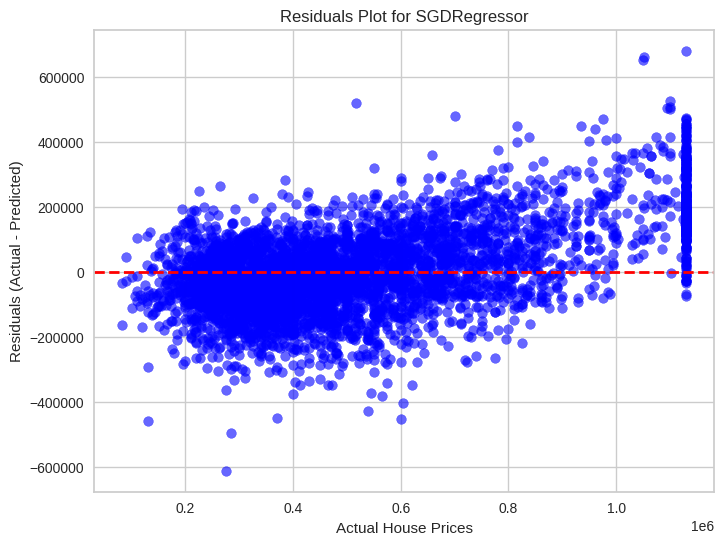

In [ ]:
train_and_evaluate_model(SGDRegressor(), final_X_train, y_train, final_X_test, y_test)

## Passive Aggressive Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 10945.2152
       Root Mean Squared Error (RMSE) : 132653.1167
            Mean Absolute Error (MAE) : 100514.8199
          Mean Percentage Error (MPE) : -3.9689
Mean Absolute Percentage Error (MAPE) : 21.7852

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 13182.8196
       Root Mean Squared Error (RMSE) : 134054.2016
            Mean Absolute Error (MAE) : 101223.0984
          Mean Percentage Error (MPE) : -3.5902
Mean Absolute Percentage Error (MAPE) : 21.7056



R2 Score: 0.7199214670047185
MAE: 101223.09842103922
MSE: 17970528956.708035
RMSE: 134054.20156305446
MAPE: 0.2170558358616614





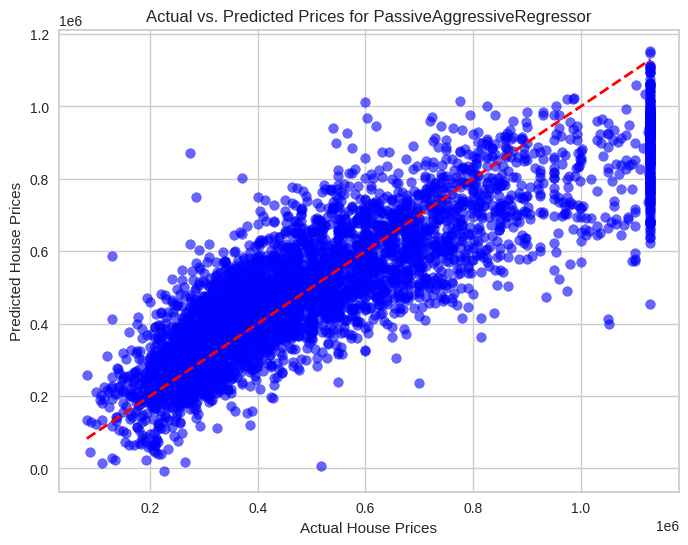

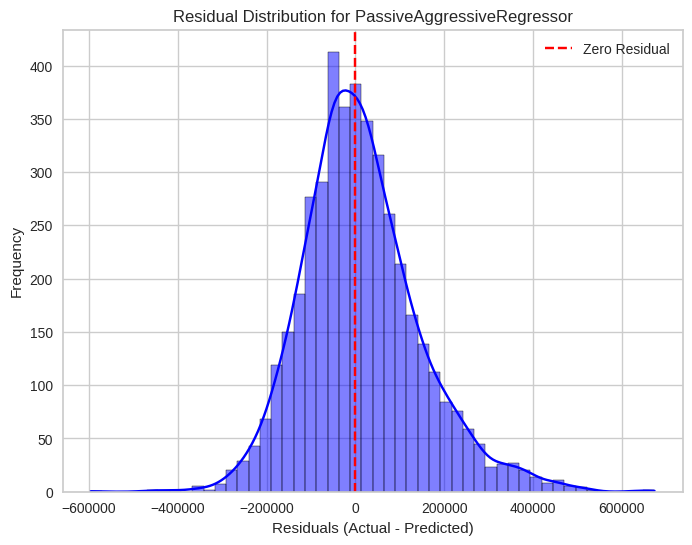

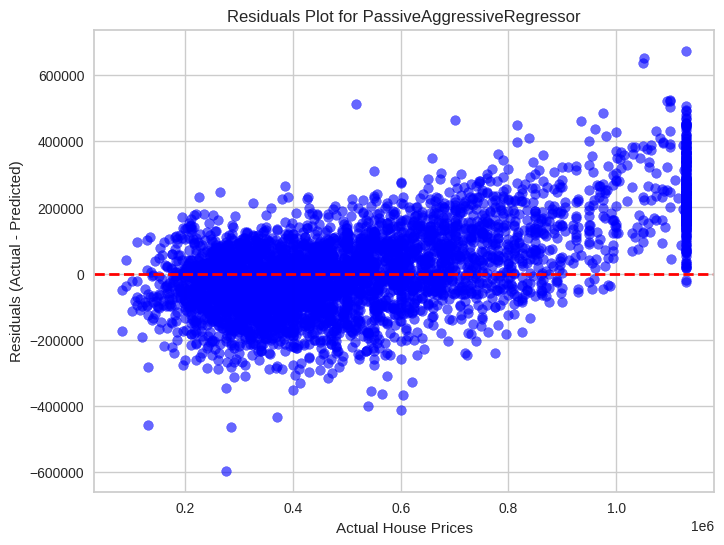

In [ ]:
train_and_evaluate_model(PassiveAggressiveRegressor(), final_X_train, y_train, final_X_test, y_test)

## Multi-Layer Perceptron (MLP) Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 424222.9581
       Root Mean Squared Error (RMSE) : 486185.0993
            Mean Absolute Error (MAE) : 424222.9581
          Mean Percentage Error (MPE) : 80.1393
Mean Absolute Percentage Error (MAPE) : 80.1393

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 430142.2294
       Root Mean Squared Error (RMSE) : 493207.9448
            Mean Absolute Error (MAE) : 430142.2294
          Mean Percentage Error (MPE) : 80.3365
Mean Absolute Percentage Error (MAPE) : 80.3365



R2 Score: -2.79122090136766
MAE: 430142.22944660584
MSE: 243254076850.1242
RMSE: 493207.94483678404
MAPE: 0.8033651392571424





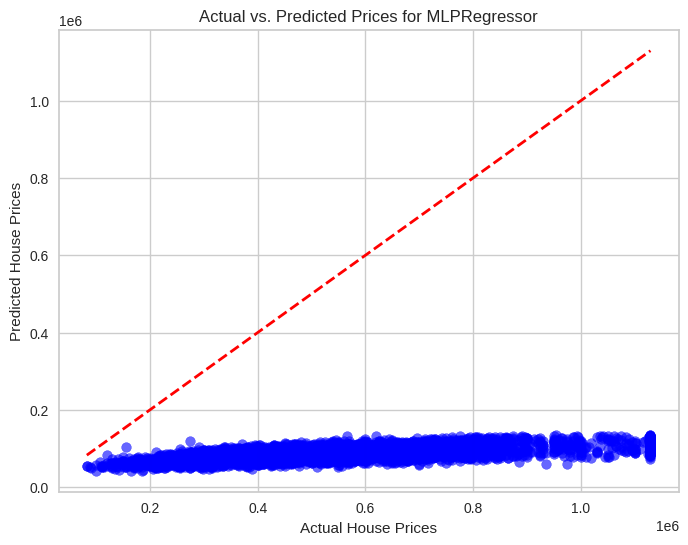

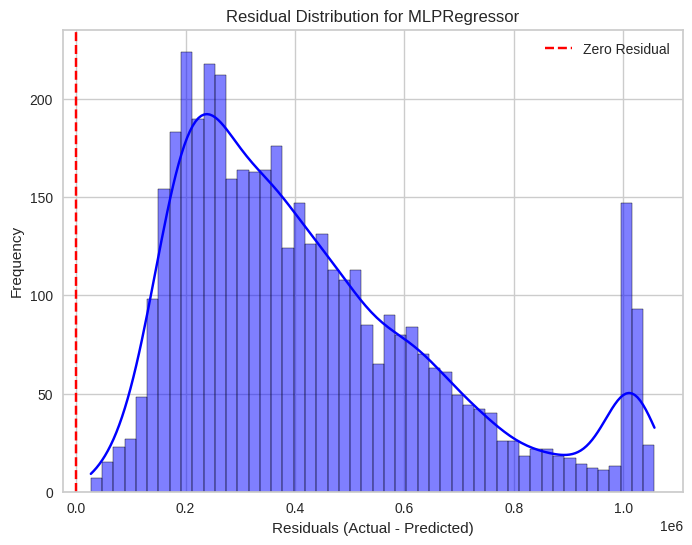

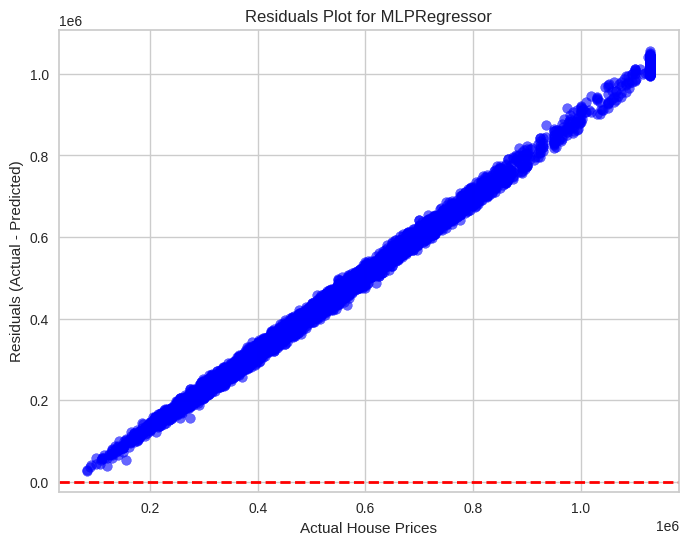

In [ ]:
train_and_evaluate_model(MLPRegressor(), final_X_train, y_train, final_X_test, y_test)

## Bayesian Ridge Regression

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 131443.4288
            Mean Absolute Error (MAE) : 100865.1611
          Mean Percentage Error (MPE) : -5.7049
Mean Absolute Percentage Error (MAPE) : 22.5147

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 1990.9654
       Root Mean Squared Error (RMSE) : 132544.9689
            Mean Absolute Error (MAE) : 101308.5396
          Mean Percentage Error (MPE) : -5.3337
Mean Absolute Percentage Error (MAPE) : 22.3559



R2 Score: 0.7261924258783587
MAE: 101308.53964004891
MSE: 17568168780.010822
RMSE: 132544.9688973928
MAPE: 0.22355948333789336





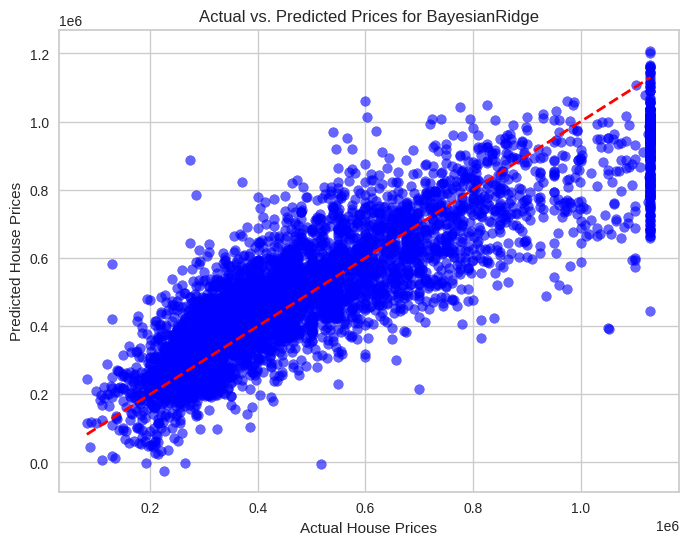

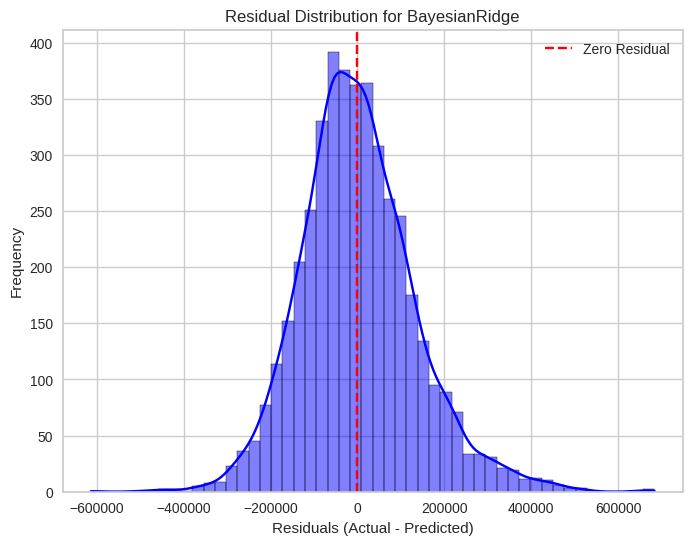

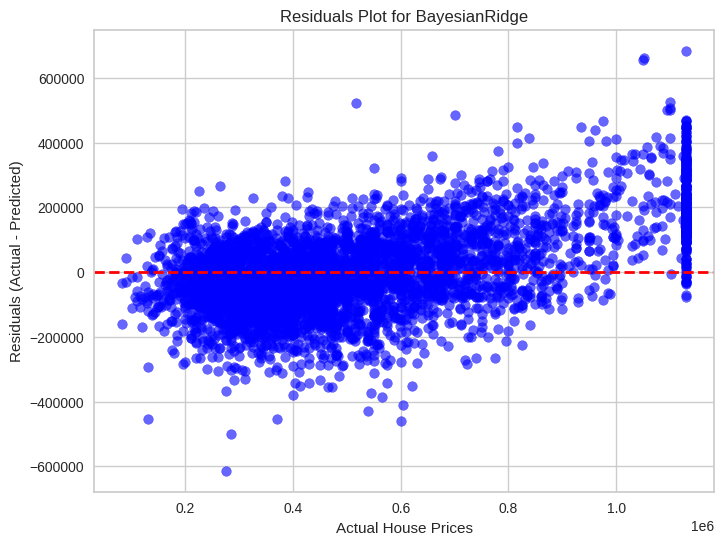

In [ ]:
train_and_evaluate_model(BayesianRidge(), final_X_train, y_train, final_X_test, y_test)

## Lasso Regression

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 131443.4250
            Mean Absolute Error (MAE) : 100865.6110
          Mean Percentage Error (MPE) : -5.7029
Mean Absolute Percentage Error (MAPE) : 22.5151

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 1990.4268
       Root Mean Squared Error (RMSE) : 132544.9618
            Mean Absolute Error (MAE) : 101308.8535
          Mean Percentage Error (MPE) : -5.3318
Mean Absolute Percentage Error (MAPE) : 22.3563



R2 Score: 0.7261924550305521
MAE: 101308.8534722827
MSE: 17568166909.53425
RMSE: 132544.96184138517
MAPE: 0.2235626715454185





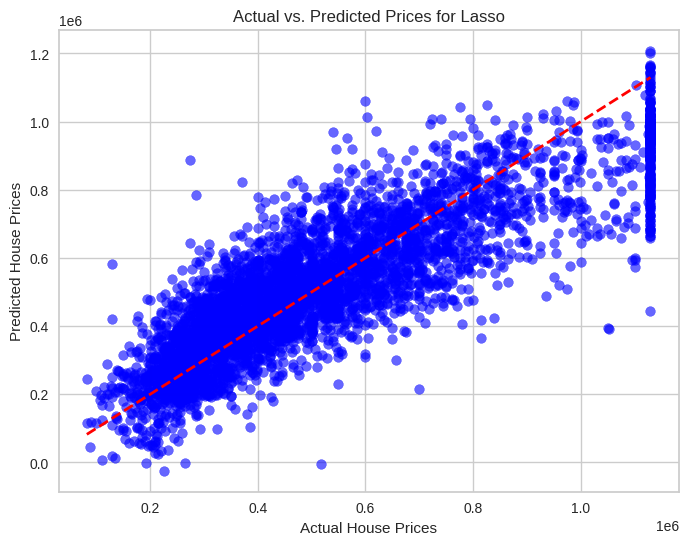

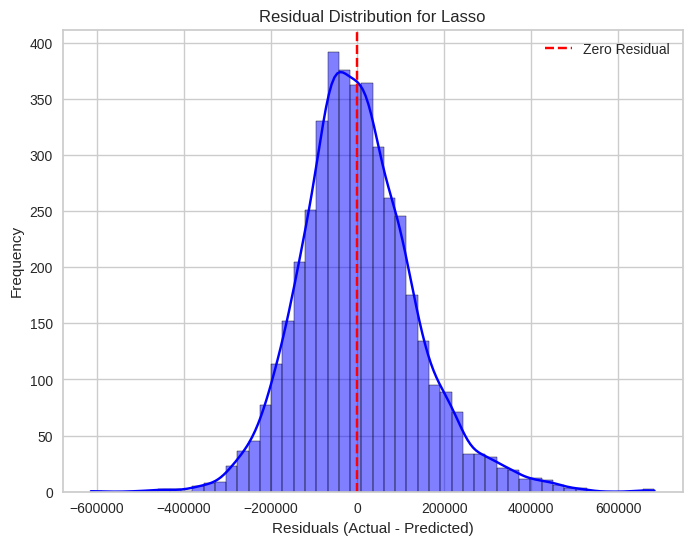

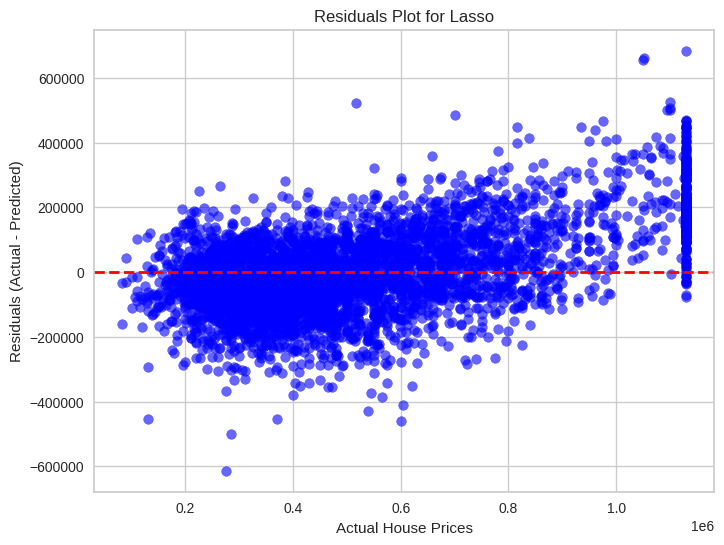

In [ ]:
train_and_evaluate_model(Lasso(), final_X_train, y_train, final_X_test, y_test)

## Ridge Regression

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 131443.5459
            Mean Absolute Error (MAE) : 100860.8261
          Mean Percentage Error (MPE) : -5.7162
Mean Absolute Percentage Error (MAPE) : 22.5115

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 1993.8763
       Root Mean Squared Error (RMSE) : 132546.0007
            Mean Absolute Error (MAE) : 101305.4306
          Mean Percentage Error (MPE) : -5.3443
Mean Absolute Percentage Error (MAPE) : 22.3530



R2 Score: 0.7261881629928603
MAE: 101305.43059400145
MSE: 17568442297.250683
RMSE: 132546.00068372747
MAPE: 0.223530262414243





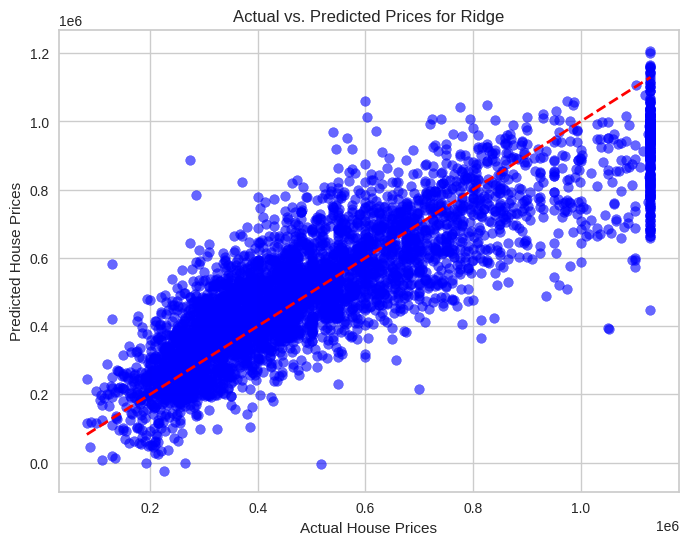

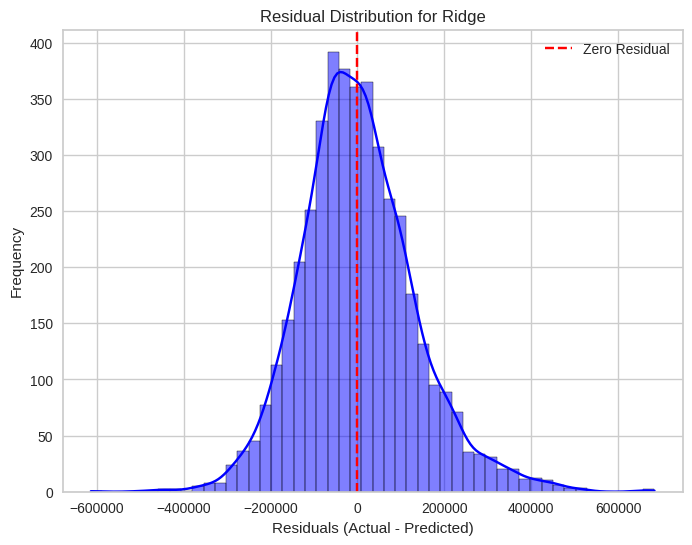

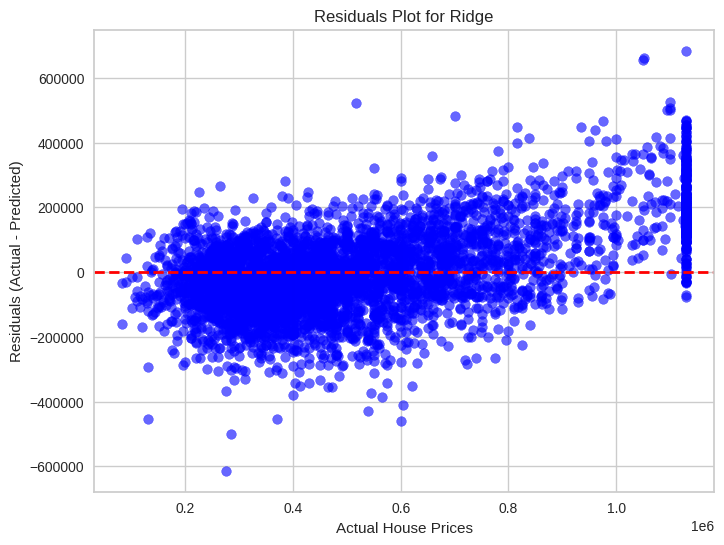

In [ ]:
train_and_evaluate_model(Ridge(), final_X_train, y_train, final_X_test, y_test)

## Elastic Net Regression

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 220136.3959
            Mean Absolute Error (MAE) : 175043.9461
          Mean Percentage Error (MPE) : -22.6886
Mean Absolute Percentage Error (MAPE) : 42.7447

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 5476.0954
       Root Mean Squared Error (RMSE) : 223603.2874
            Mean Absolute Error (MAE) : 177442.3096
          Mean Percentage Error (MPE) : -21.5679
Mean Absolute Percentage Error (MAPE) : 42.3811



R2 Score: 0.2207526556158752
MAE: 177442.30955841442
MSE: 49998430143.62214
RMSE: 223603.28741684934
MAPE: 0.42381117316752326





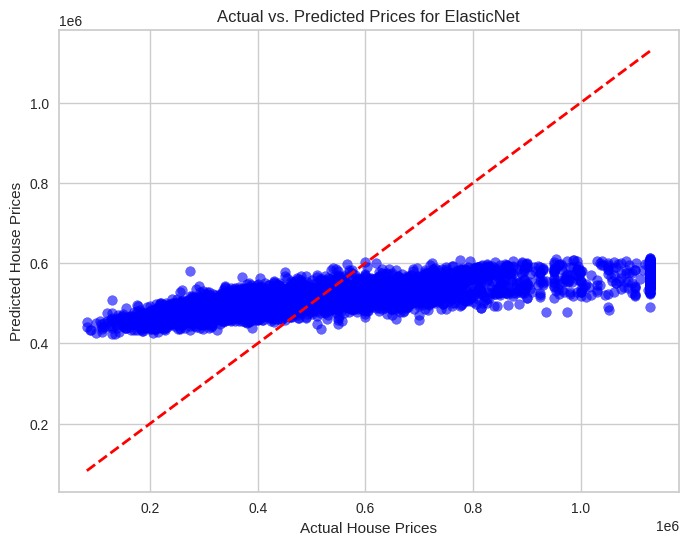

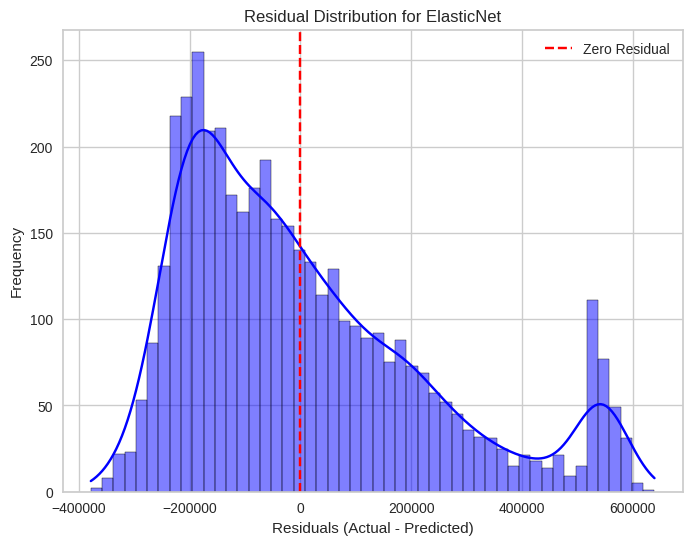

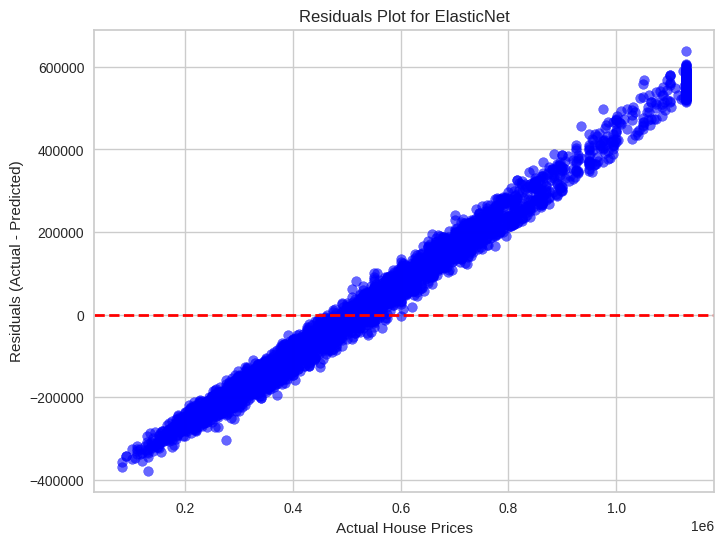

In [ ]:
train_and_evaluate_model(ElasticNet(), final_X_train, y_train, final_X_test, y_test)

## ARD Regression

Training Data statistics

Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 131443.4776
            Mean Absolute Error (MAE) : 100861.7592
          Mean Percentage Error (MPE) : -5.7045
Mean Absolute Percentage Error (MAPE) : 22.5123

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 1990.4030
       Root Mean Squared Error (RMSE) : 132546.7889
            Mean Absolute Error (MAE) : 101306.6873
          Mean Percentage Error (MPE) : -5.3334
Mean Absolute Percentage Error (MAPE) : 22.3540



R2 Score: 0.7261849065103654
MAE: 101306.6873263451
MSE: 17568651241.193462
RMSE: 132546.7888754513
MAPE: 0.2235395203800413





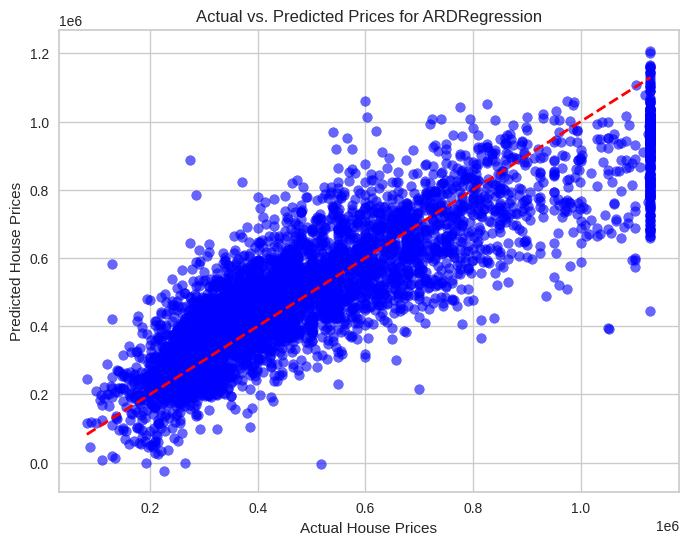

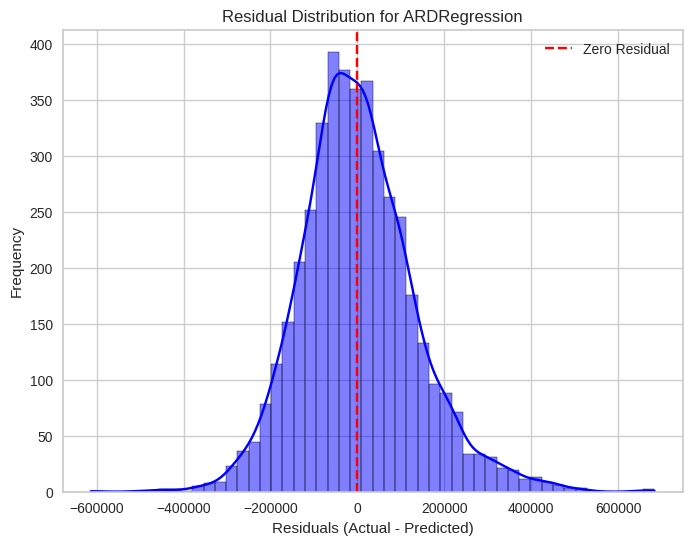

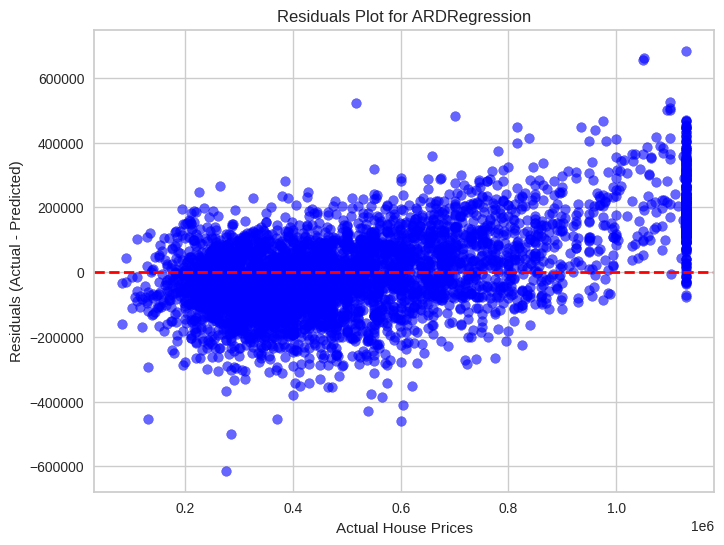

In [ ]:
train_and_evaluate_model(ARDRegression(), final_X_train, y_train, final_X_test, y_test)

## Huber Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 8658.7186
       Root Mean Squared Error (RMSE) : 132020.7561
            Mean Absolute Error (MAE) : 100374.6570
          Mean Percentage Error (MPE) : -4.2420
Mean Absolute Percentage Error (MAPE) : 21.9100

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 10807.0628
       Root Mean Squared Error (RMSE) : 133390.8880
            Mean Absolute Error (MAE) : 100953.1540
          Mean Percentage Error (MPE) : -3.8658
Mean Absolute Percentage Error (MAPE) : 21.7864



R2 Score: 0.7226863228983444
MAE: 100953.1539558038
MSE: 17793128988.32714
RMSE: 133390.88795089093
MAPE: 0.21786352972994688





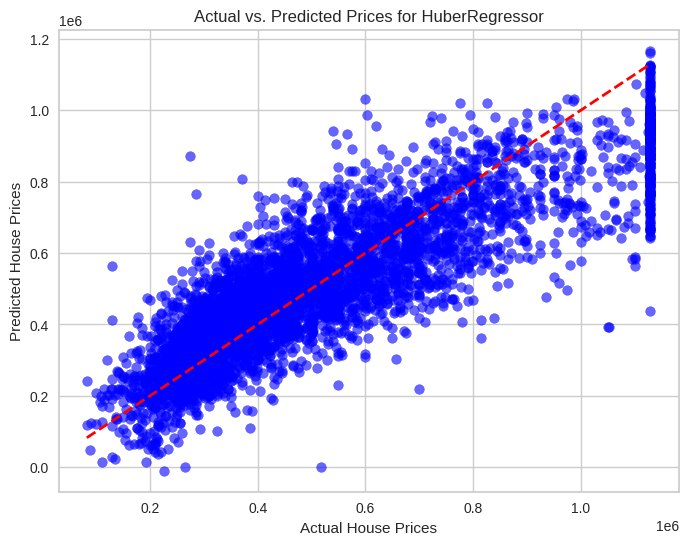

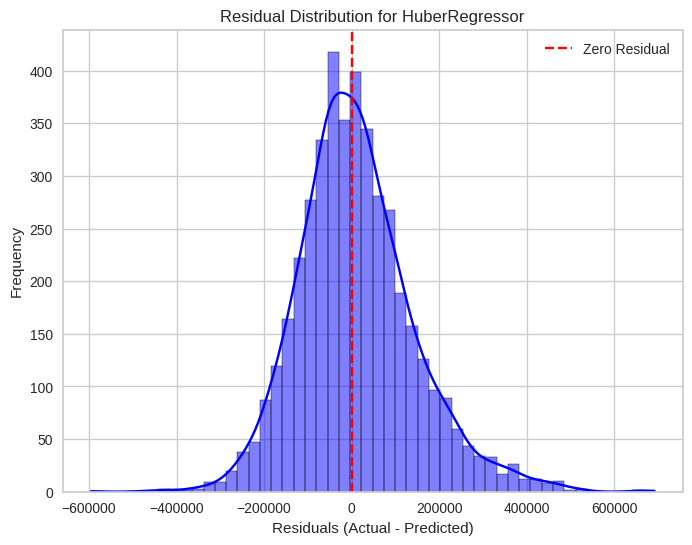

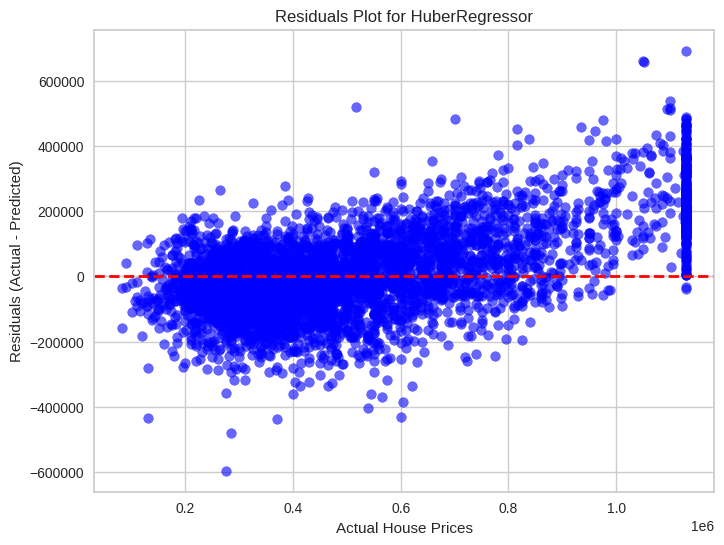

In [ ]:
train_and_evaluate_model(HuberRegressor(), final_X_train, y_train, final_X_test, y_test)

## RANSAC Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 5377.4547
       Root Mean Squared Error (RMSE) : 146138.6257
            Mean Absolute Error (MAE) : 112337.4399
          Mean Percentage Error (MPE) : -5.0064
Mean Absolute Percentage Error (MAPE) : 25.6012

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 7885.3435
       Root Mean Squared Error (RMSE) : 146916.7294
            Mean Absolute Error (MAE) : 111805.5350
          Mean Percentage Error (MPE) : -4.3299
Mean Absolute Percentage Error (MAPE) : 25.0557



R2 Score: 0.6635957562467225
MAE: 111805.53502427856
MSE: 21584525378.921436
RMSE: 146916.72940452164
MAPE: 0.2505569866558903





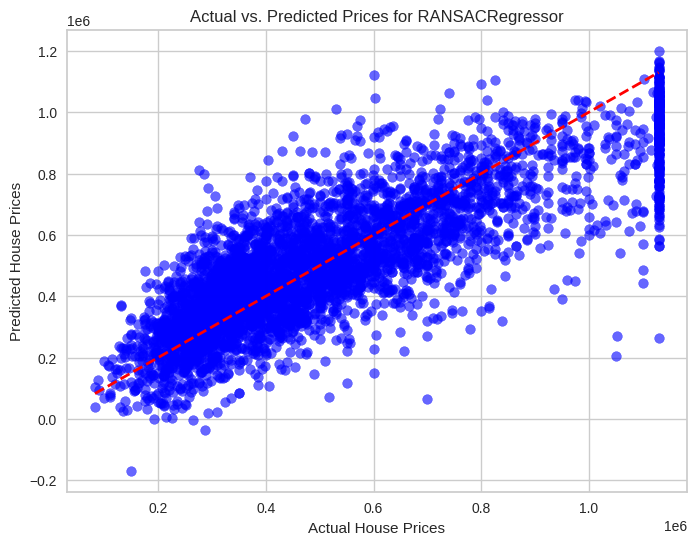

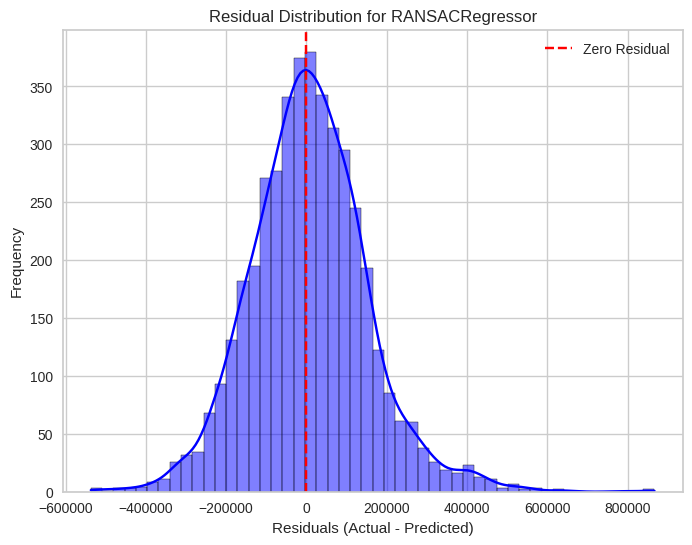

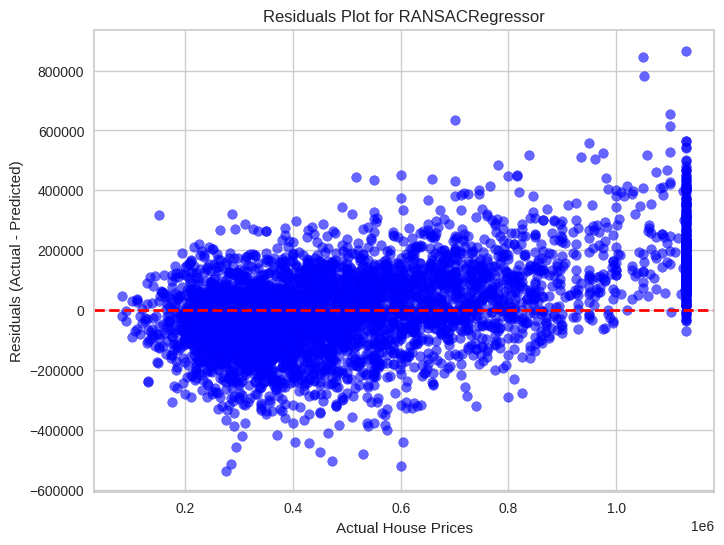

In [ ]:
train_and_evaluate_model(RANSACRegressor(), final_X_train, y_train, final_X_test, y_test)

## Theil Sen Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 13131.3720
       Root Mean Squared Error (RMSE) : 132773.0798
            Mean Absolute Error (MAE) : 100391.8685
          Mean Percentage Error (MPE) : -3.4446
Mean Absolute Percentage Error (MAPE) : 21.6679

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 15380.6516
       Root Mean Squared Error (RMSE) : 134274.1692
            Mean Absolute Error (MAE) : 101078.1656
          Mean Percentage Error (MPE) : -3.0692
Mean Absolute Percentage Error (MAPE) : 21.5744



R2 Score: 0.7190015590182537
MAE: 101078.16559755482
MSE: 18029552520.318855
RMSE: 134274.16922222552
MAPE: 0.2157439480473037





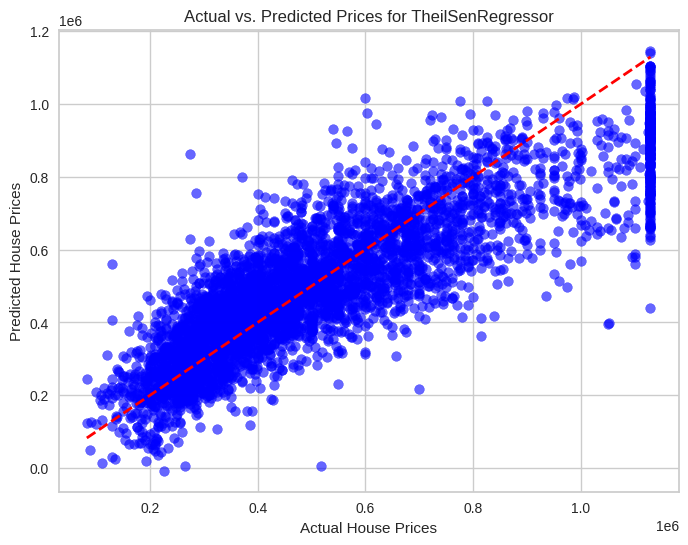

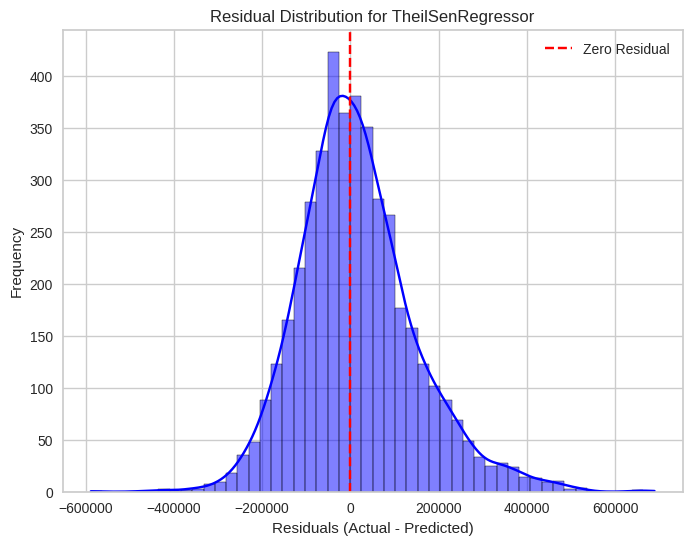

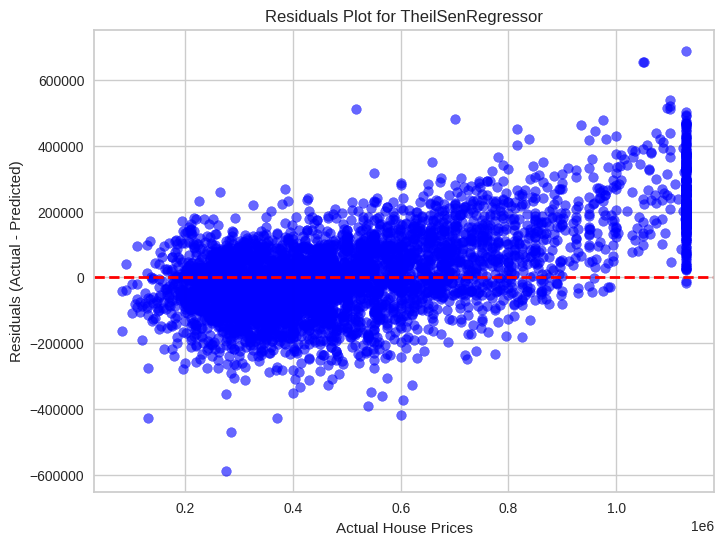

In [ ]:
train_and_evaluate_model(TheilSenRegressor(), final_X_train, y_train, final_X_test, y_test)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1140
[LightGBM] [Info] Number of data points in the train set: 17290, number of used features: 6
[LightGBM] [Info] Start training from score 510377.532620
Training Data statistics

Regression statistics

                      Mean Error (ME) : 58.5510
       Root Mean Squared Error (RMSE) : 71377.7587
            Mean Absolute Error (MAE) : 49698.1812
          Mean Percentage Error (MPE) : -2.6568
Mean Absolute Percentage Error (MAPE) : 11.1562

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2741.1169
       Root Mean Squared Error (RMSE) : 84615.2574
            Mean Absolute Error (MAE) : 58142.2504
          Mean Percentage Error (MPE) : -2.4989
Mean Absolute Percentage Error (MAPE) : 12.5193



R2 Score: 0.8884123009968777
MAE: 58142.25038326825
MSE: 71

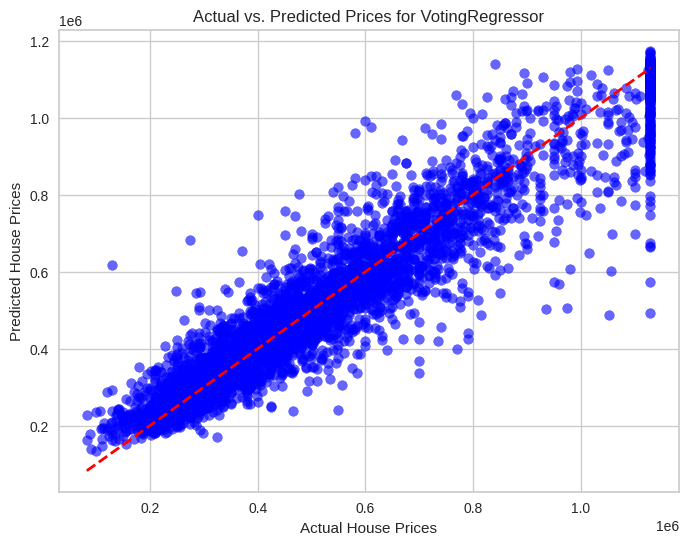

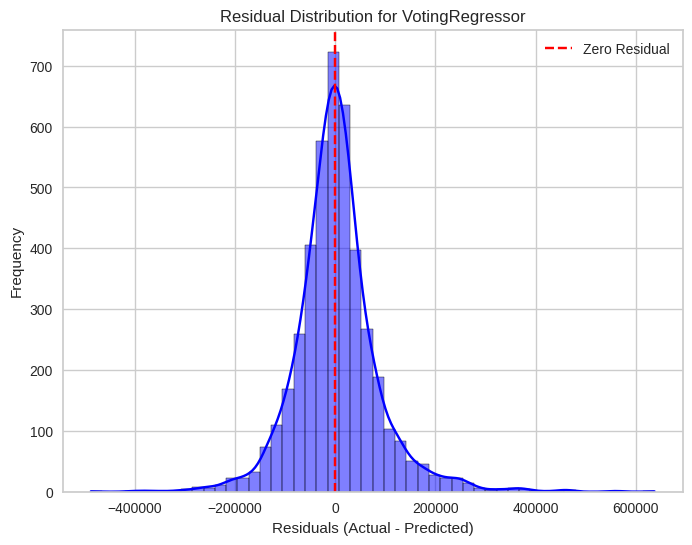

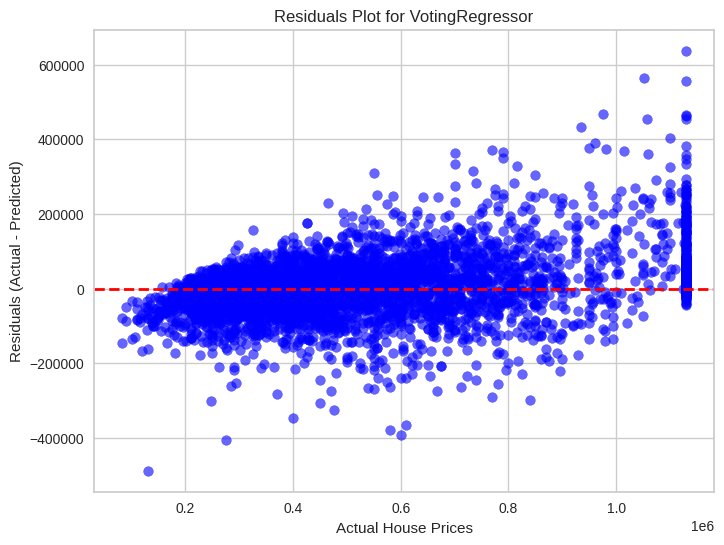

In [ ]:
train_and_evaluate_model(VotingRegressor(estimators=[
    ('CAT',CatBoostRegressor(silent=True)),
    ('HGB',HistGradientBoostingRegressor()),
    ('LGBM',LGBMRegressor())
]), final_X_train, y_train, final_X_test, y_test)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 17290, number of used features: 2
[LightGBM] [Info] Start training from score 510377.532620
Training Data statistics

Regression statistics

                      Mean Error (ME) : -226.8683
       Root Mean Squared Error (RMSE) : 70094.0078
            Mean Absolute Error (MAE) : 48824.5750
          Mean Percentage Error (MPE) : -2.5108
Mean Absolute Percentage Error (MAPE) : 10.9880

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 2657.2871
       Root Mean Squared Error (RMSE) : 83525.0005
            Mean Absolute Error (MAE) : 57293.4966
          Mean Percentage Error (MPE) : -2.3659
Mean Absolute Percentage Error (MAPE) : 12.4346



R2 Score: 0.891269362163075
MAE: 57293.496605161396
MSE: 6

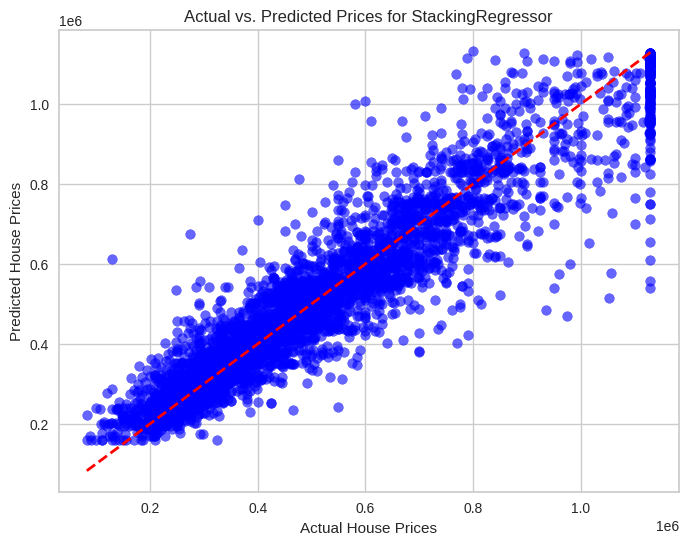

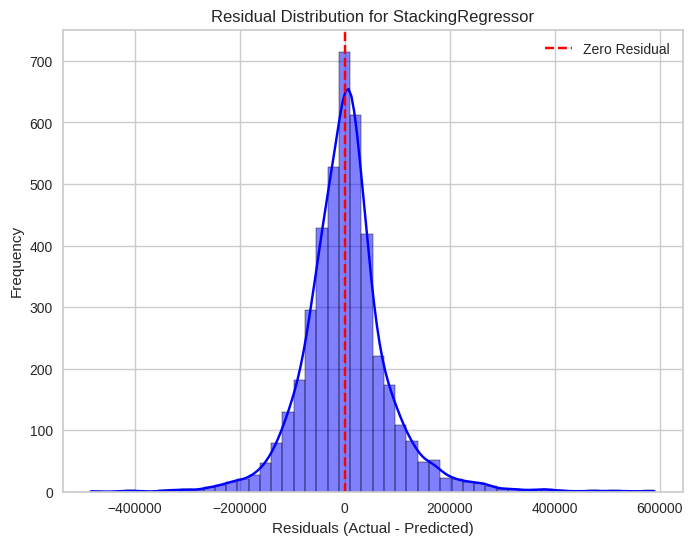

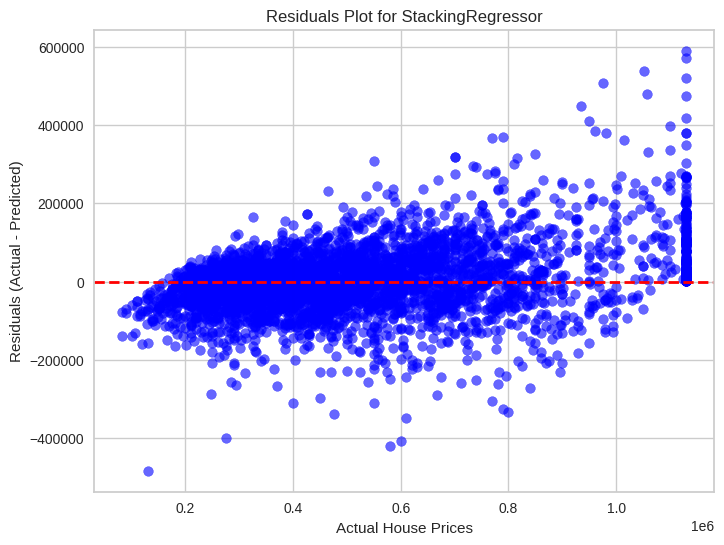

In [ ]:
train_and_evaluate_model(StackingRegressor(estimators=[
    ('HGB', HistGradientBoostingRegressor()),
    ('CAT',CatBoostRegressor(silent=True))
], final_estimator=LGBMRegressor(), verbose=1), final_X_train, y_train, final_X_test, y_test)

## Tweedie Regressor

Training Data statistics

Regression statistics

                      Mean Error (ME) : 0.0001
       Root Mean Squared Error (RMSE) : 232827.4203
            Mean Absolute Error (MAE) : 185225.1868
          Mean Percentage Error (MPE) : -24.2282
Mean Absolute Percentage Error (MAPE) : 45.4386

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 5735.4813
       Root Mean Squared Error (RMSE) : 236624.8159
            Mean Absolute Error (MAE) : 187961.9823
          Mean Percentage Error (MPE) : -23.0672
Mean Absolute Percentage Error (MAPE) : 45.0989



R2 Score: 0.1273511098822251
MAE: 187961.98233670508
MSE: 55991303514.73525
RMSE: 236624.81593175145
MAPE: 0.4509893829872427





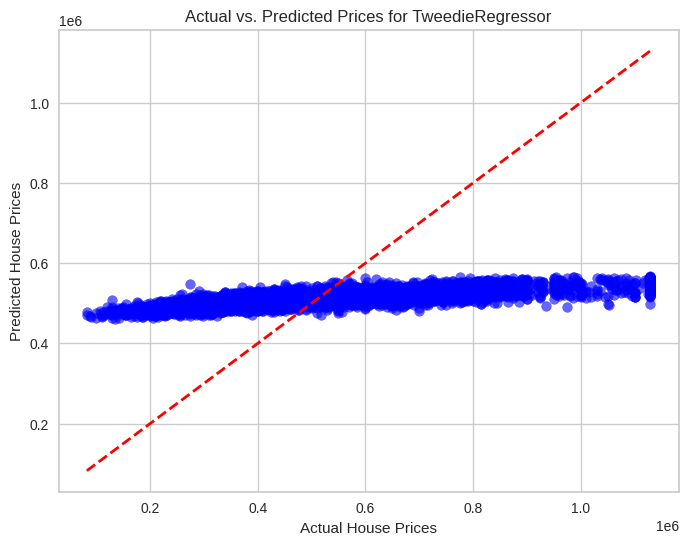

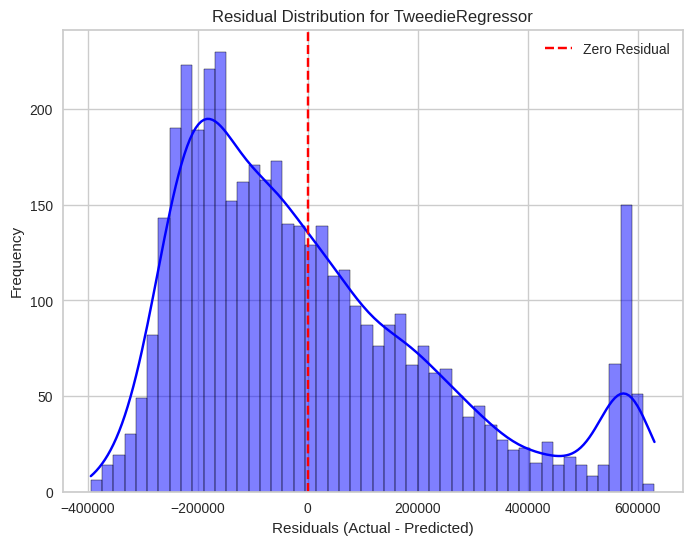

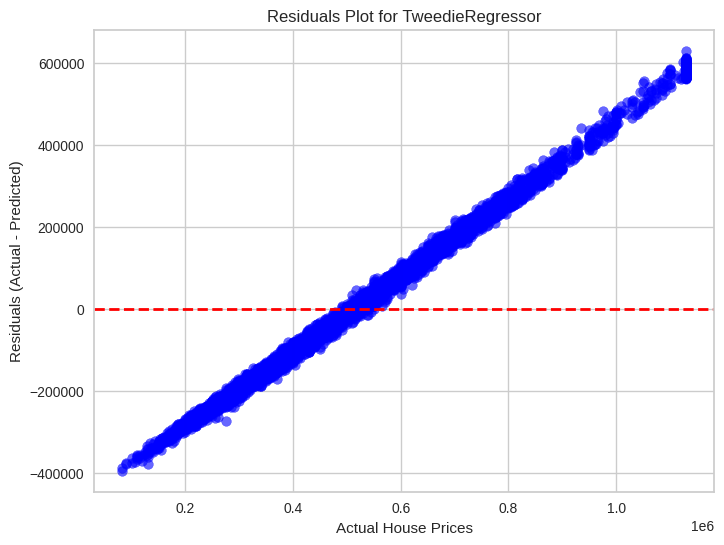

In [ ]:
train_and_evaluate_model(TweedieRegressor(), final_X_train, y_train, final_X_test, y_test)

## Nu SVR

Training Data statistics

Regression statistics

                      Mean Error (ME) : 29755.3054
       Root Mean Squared Error (RMSE) : 250065.3293
            Mean Absolute Error (MAE) : 193286.3651
          Mean Percentage Error (MPE) : -18.6725
Mean Absolute Percentage Error (MAPE) : 44.9836

Testing Data statistics

Regression statistics

                      Mean Error (ME) : 35789.5555
       Root Mean Squared Error (RMSE) : 254957.3232
            Mean Absolute Error (MAE) : 197067.0274
          Mean Percentage Error (MPE) : -17.5403
Mean Absolute Percentage Error (MAPE) : 44.8180



R2 Score: -0.01310379922503424
MAE: 197067.02737464802
MSE: 65003236647.31247
RMSE: 254957.32318823962
MAPE: 0.4481800699052576





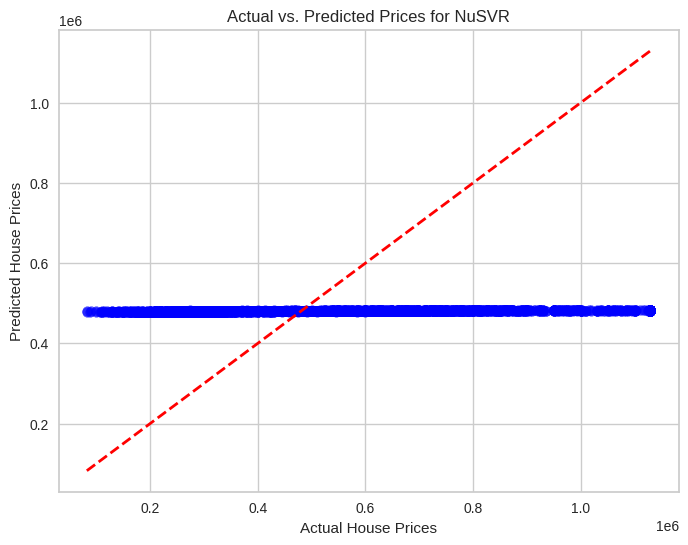

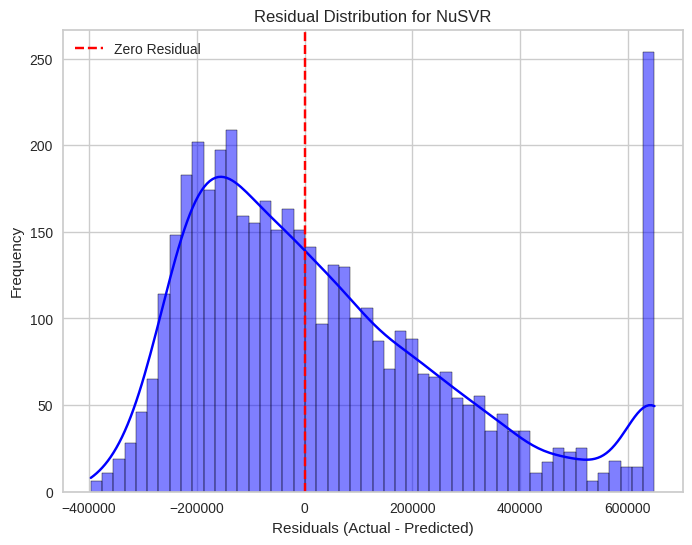

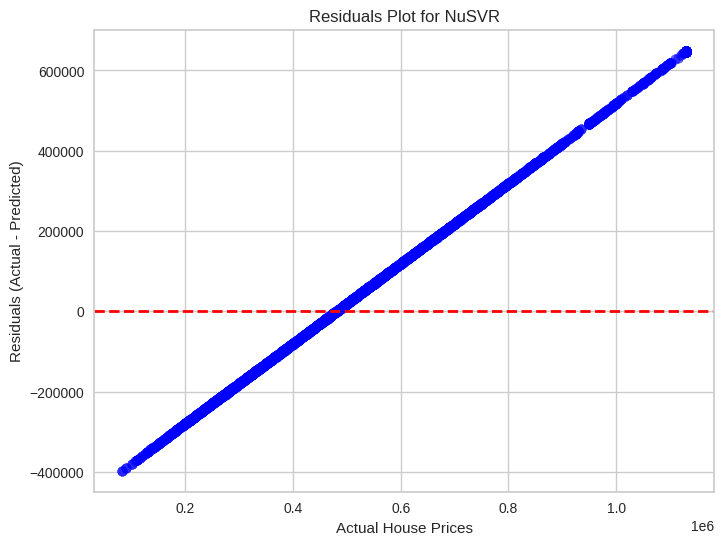

In [ ]:
train_and_evaluate_model(NuSVR(), final_X_train, y_train, final_X_test, y_test)

# Models Comparison

In [ ]:
model_perfs = pd.DataFrame({'Model': model_names,
                           'R2': r2_scores,
                           'MAE': mae_scores,
                           'MSE': mse_scores,
                           'RMSE': rmse_scores,
                           'MAPE': mape_scores})
model_perfs = model_perfs.sort_values('R2', ascending=False).reset_index(drop=True)
model_perfs

,Model,R2,MAE,MSE,RMSE,MAPE
0,CatBoostRegressor,0.891519,57425.515659,6.960405e+09,83429.039970,0.123813
1,StackingRegressor,0.891269,57293.496605,6.976426e+09,83525.000452,0.124346
2,VotingRegressor,0.888412,58142.250383,7.159742e+09,84615.257409,0.125193
3,HistGradientBoostingRegressor,0.884877,59225.772907,7.386545e+09,85945.014184,0.127802
4,LGBMRegressor,0.883832,59512.892316,7.453611e+09,86334.300770,0.128157
5,XGBRegressor,0.880356,60219.024428,7.676686e+09,87616.698697,0.129543
6,RandomForestRegressor,0.879499,59889.766520,7.731628e+09,87929.676322,0.129372
7,ExtraTreesRegressor,0.874010,60987.880613,8.083840e+09,89910.175210,0.131309
8,BaggingRegressor,0.869680,62445.227930,8.361639e+09,91441.999288,0.134202
9,GradientBoostingRegressor,0.858263,67480.488761,9.094216e+09,95363.596672,0.144358


The top-performing models are RandomizedSearchCV(CatBoostRegressor) and CatBoostRegressor, achieving the highest R² scores (89.15) and RMSE ($83K), making them the most reliable for this regression task. StackingRegressor and VotingRegressor also perform well, but slightly lag behind.<br>
Boosting-based models (CatBoost, HistGradientBoosting, LGBM, and XGBoost) generally outperform traditional models like Random Forest and Extra Trees, though RandomForestRegressor still holds a competitive R² (0.88).<br>
Linear models (LinearRegression, Ridge, Lasso, BayesianRidge, ARDRegression) show similar performance (~0.72 R²), indicating that the data follows a somewhat linear pattern but benefits from non-linear modeling.<br>
The SVR models struggled, with NuSVR/SVR even showing negative R², meaning they failed to capture meaningful patterns.<br>
Neural networks (MLPRegressor) performed the worst, with a catastrophic R² of -2.79, suggesting significant underfitting or improper hyperparameter tuning.

